In [ ]:
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive



# Chatbot Tutorial
**Author:** [Matthew Inkawhich](https://github.com/MatthewInkawhich)


In this tutorial, we explore a fun and interesting use-case of recurrent
sequence-to-sequence models. We will train a simple chatbot using movie
scripts from the [Cornell Movie-Dialogs
Corpus](https://www.cs.cornell.edu/~cristian/Cornell_Movie-Dialogs_Corpus.html)_.

Conversational models are a hot topic in artificial intelligence
research. Chatbots can be found in a variety of settings, including
customer service applications and online helpdesks. These bots are often
powered by retrieval-based models, which output predefined responses to
questions of certain forms. In a highly restricted domain like a
company’s IT helpdesk, these models may be sufficient, however, they are
not robust enough for more general use-cases. Teaching a machine to
carry out a meaningful conversation with a human in multiple domains is
a research question that is far from solved. Recently, the deep learning
boom has allowed for powerful generative models like Google’s [Neural
Conversational Model](https://arxiv.org/abs/1506.05869)_, which marks
a large step towards multi-domain generative conversational models. In
this tutorial, we will implement this kind of model in PyTorch.

.. figure:: /_static/img/chatbot/bot.png
   :align: center
   :alt: bot

.. code:: python

  > hello?
  Bot: hello .
  > where am I?
  Bot: you re in a hospital .
  > who are you?
  Bot: i m a lawyer .
  > how are you doing?
  Bot: i m fine .
  > are you my friend?
  Bot: no .
  > you're under arrest
  Bot: i m trying to help you !
  > i'm just kidding
  Bot: i m sorry .
  > where are you from?
  Bot: san francisco .
  > it's time for me to leave
  Bot: i know .
  > goodbye
  Bot: goodbye .

**Tutorial Highlights**

-  Handle loading and preprocessing of [Cornell Movie-Dialogs
   Corpus](https://www.cs.cornell.edu/~cristian/Cornell_Movie-Dialogs_Corpus.html)_
   dataset
-  Implement a sequence-to-sequence model with [Luong attention
   mechanism(s)](https://arxiv.org/abs/1508.04025)_
-  Jointly train encoder and decoder models using mini-batches
-  Implement greedy-search decoding module
-  Interact with trained chatbot

**Acknowledgements**

This tutorial borrows code from the following sources:

1) Yuan-Kuei Wu’s pytorch-chatbot implementation:
   https://github.com/ywk991112/pytorch-chatbot

2) Sean Robertson’s practical-pytorch seq2seq-translation example:
   https://github.com/spro/practical-pytorch/tree/master/seq2seq-translation

3) FloydHub’s Cornell Movie Corpus preprocessing code:
   https://github.com/floydhub/textutil-preprocess-cornell-movie-corpus




## Preparations

To start, Download the data ZIP file
[here](https://zissou.infosci.cornell.edu/convokit/datasets/movie-corpus/movie-corpus.zip)_



In [ ]:
# and put in a ``data/`` directory under the current directory.
#
# After that, let’s import some necessities.
#

from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
from __future__ import unicode_literals

import torch
from torch.jit import script, trace
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import csv
import random
import re
import os
import unicodedata
import codecs
from io import open
import itertools
import math
import json


USE_CUDA = torch.cuda.is_available()
device = torch.device("cuda" if USE_CUDA else "cpu")

## Load & Preprocess Data

The next step is to reformat our data file and load the data into
structures that we can work with.

The [Cornell Movie-Dialogs
Corpus](https://www.cs.cornell.edu/~cristian/Cornell_Movie-Dialogs_Corpus.html)_
is a rich dataset of movie character dialog:

-  220,579 conversational exchanges between 10,292 pairs of movie
   characters
-  9,035 characters from 617 movies
-  304,713 total utterances

This dataset is large and diverse, and there is a great variation of
language formality, time periods, sentiment, etc. Our hope is that this
diversity makes our model robust to many forms of inputs and queries.

First, we’ll take a look at some lines of our datafile to see the
original format.




In [ ]:
corpus_name = "data"
corpus = os.path.join("/content/drive/My Drive/Colab Notebooks", corpus_name)

def printLines(file, n=10):
    with open(file, 'rb') as datafile:
        lines = datafile.readlines()
    for line in lines[:n]:
        print(line)

printLines(os.path.join(corpus, "movie_lines.txt"))

b'L1045 +++$+++ u0 +++$+++ m0 +++$+++ BIANCA +++$+++ They do not!\n'
b'L1044 +++$+++ u2 +++$+++ m0 +++$+++ CAMERON +++$+++ They do to!\n'
b'L985 +++$+++ u0 +++$+++ m0 +++$+++ BIANCA +++$+++ I hope so.\n'
b'L984 +++$+++ u2 +++$+++ m0 +++$+++ CAMERON +++$+++ She okay?\n'
b"L925 +++$+++ u0 +++$+++ m0 +++$+++ BIANCA +++$+++ Let's go.\n"
b'L924 +++$+++ u2 +++$+++ m0 +++$+++ CAMERON +++$+++ Wow\n'
b"L872 +++$+++ u0 +++$+++ m0 +++$+++ BIANCA +++$+++ Okay -- you're gonna need to learn how to lie.\n"
b'L871 +++$+++ u2 +++$+++ m0 +++$+++ CAMERON +++$+++ No\n'
b'L870 +++$+++ u0 +++$+++ m0 +++$+++ BIANCA +++$+++ I\'m kidding.  You know how sometimes you just become this "persona"?  And you don\'t know how to quit?\n'
b'L869 +++$+++ u0 +++$+++ m0 +++$+++ BIANCA +++$+++ Like my fear of wearing pastels?\n'


### Create formatted data file

For convenience, we'll create a nicely formatted data file in which each line
contains a tab-separated *query sentence* and a *response sentence* pair.

The following functions facilitate the parsing of the raw
*utterances.jsonl* data file.

-  ``loadLinesAndConversations`` splits each line of the file into a dictionary of
   lines with fields: lineID, characterID, and text and then groups them
   into conversations with fields: conversationID, movieID, and lines.
-  ``extractSentencePairs`` extracts pairs of sentences from
   conversations




In [ ]:
# Splits each line of the file to create lines and conversations
def loadLines(fileName, fields):
    lines = {}
    with open(fileName, 'r', encoding='iso-8859-1') as f:
        for line in f:
            values = line.split(" +++$+++ ")
            # Extract fields
            lineObj = {}
            for i, field in enumerate(fields):
                lineObj[field] = values[i]
            lines[lineObj['lineID']] = lineObj

    print(lines)

    return lines


# Groups fields of lines from `loadLines` into conversations based on *movie_conversations.txt*
def loadConversations(fileName, lines, fields):
    conversations = []
    with open(fileName, 'r', encoding='iso-8859-1') as f:
        for line in f:
            values = line.split(" +++$+++ ")
            # Extract fields
            convObj = {}
            for i, field in enumerate(fields):
                convObj[field] = values[i]
            # Convert string to list (convObj["utteranceIDs"] == "['L598485', 'L598486', ...]")
            utterance_id_pattern = re.compile('L[0-9]+')
            lineIds = utterance_id_pattern.findall(convObj["utteranceIDs"])
            # Reassemble lines
            convObj["lines"] = []
            for lineId in lineIds:
                convObj["lines"].append(lines[lineId])
            conversations.append(convObj)
    # print("conversations")
    return conversations


# Extracts pairs of sentences from conversations
def extractSentencePairs(conversations):
    qa_pairs = []
    for conversation in conversations:
        # Iterate over all the lines of the conversation
        for i in range(len(conversation["lines"]) - 1):  # We ignore the last line (no answer for it)
            inputLine = conversation["lines"][i]["text"].strip()
            targetLine = conversation["lines"][i+1]["text"].strip()
            # Filter wrong samples (if one of the lists is empty)
            if inputLine and targetLine:
                qa_pairs.append([inputLine, targetLine])
    # print(qa_pairs)
    return qa_pairs

In [ ]:
print(loadLines())

TypeError: ignored

Now we’ll call these functions and create the file. We’ll call it
*formatted_movie_lines.txt*.




In [ ]:
# Dataset 1 - Define path to new file
datafile = os.path.join(corpus, "formatted_movie_lines.txt")

delimiter = '\t'
# Unescape the delimiter
delimiter = str(codecs.decode(delimiter, "unicode_escape"))

# Initialize lines dict, conversations list, and field ids
lines = {}
conversations = []
MOVIE_LINES_FIELDS = ["lineID", "characterID", "movieID", "character", "text"]
MOVIE_CONVERSATIONS_FIELDS = ["character1ID", "character2ID", "movieID", "utteranceIDs"]

# Load lines and process conversations
print("\nProcessing corpus...")
lines = loadLines(os.path.join(corpus, "movie_lines.txt"), MOVIE_LINES_FIELDS)
print("\nLoading conversations...")
conversations = loadConversations(os.path.join(corpus, "movie_conversations.txt"),
                                  lines, MOVIE_CONVERSATIONS_FIELDS)
# for key in conversations:
#       print(key)
# print(conversations[0]['utteranceIDs'])
# print(conversations[0]['lines'])

# Write new csv file
print("\nWriting newly formatted file...")
with open(datafile, 'w', encoding='utf-8') as outputfile:
    writer = csv.writer(outputfile, delimiter=delimiter, lineterminator='\n')
    for pair in extractSentencePairs(conversations):
        writer.writerow(pair)

# Print a sample of lines
print("\nSample lines from file:")
printLines(datafile)


Processing corpus...


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Writing newly formatted file...

Sample lines from file:
b"Can we make this quick?  Roxanne Korrine and Andrew Barrett are having an incredibly horrendous public break- up on the quad.  Again.\tWell, I thought we'd start with pronunciation, if that's okay with you.\n"
b"Well, I thought we'd start with pronunciation, if that's okay with you.\tNot the hacking and gagging and spitting part.  Please.\n"
b"Not the hacking and gagging and spitting part.  Please.\tOkay... then how 'bout we try out some French cuisine.  Saturday?  Night?\n"
b"You're asking me out.  That's so cute. What's your name again?\tForget it.\n"
b"No, no, it's my fault -- we didn't have a proper introduction ---\tCameron.\n"
b"Cameron.\tThe thing is, Cameron -- I'm at the mercy of a particularly hideous breed of loser.  My sister.  I can't date until she does.\n"
b"The thing is, Cameron -- I'm at the mercy of a particularly hideous breed of loser.  My sister.  I can't date until she does.\tSeems like she could get a da

In [ ]:
print(lines["L1045"])

{'lineID': 'L1045', 'characterID': 'u0', 'movieID': 'm0', 'character': 'BIANCA', 'text': 'They do not!\n'}


In [ ]:
print(conversations[0])

{'character1ID': 'u0', 'character2ID': 'u2', 'movieID': 'm0', 'utteranceIDs': "['L194', 'L195', 'L196', 'L197']\n", 'lines': [{'lineID': 'L194', 'characterID': 'u0', 'movieID': 'm0', 'character': 'BIANCA', 'text': 'Can we make this quick?  Roxanne Korrine and Andrew Barrett are having an incredibly horrendous public break- up on the quad.  Again.\n'}, {'lineID': 'L195', 'characterID': 'u2', 'movieID': 'm0', 'character': 'CAMERON', 'text': "Well, I thought we'd start with pronunciation, if that's okay with you.\n"}, {'lineID': 'L196', 'characterID': 'u0', 'movieID': 'm0', 'character': 'BIANCA', 'text': 'Not the hacking and gagging and spitting part.  Please.\n'}, {'lineID': 'L197', 'characterID': 'u2', 'movieID': 'm0', 'character': 'CAMERON', 'text': "Okay... then how 'bout we try out some French cuisine.  Saturday?  Night?\n"}]}


### Load and trim data

Our next order of business is to create a vocabulary and load
query/response sentence pairs into memory.

Note that we are dealing with sequences of **words**, which do not have
an implicit mapping to a discrete numerical space. Thus, we must create
one by mapping each unique word that we encounter in our dataset to an
index value.

For this we define a ``Voc`` class, which keeps a mapping from words to
indexes, a reverse mapping of indexes to words, a count of each word and
a total word count. The class provides methods for adding a word to the
vocabulary (``addWord``), adding all words in a sentence
(``addSentence``) and trimming infrequently seen words (``trim``). More
on trimming later.




In [ ]:
# Default word tokens
PAD_token = 0  # Used for padding short sentences
SOS_token = 1  # Start-of-sentence token
EOS_token = 2  # End-of-sentence token

class Voc:
    def __init__(self, name):
        self.name = name
        self.trimmed = False
        self.word2index = {}
        self.word2count = {}
        self.index2word = {PAD_token: "PAD", SOS_token: "SOS", EOS_token: "EOS"}
        self.num_words = 3  # Count SOS, EOS, PAD

    def addSentence(self, sentence):
        for word in sentence.split(' '):
            self.addWord(word)

    def addWord(self, word):
        if word not in self.word2index:
            self.word2index[word] = self.num_words
            self.word2count[word] = 1
            self.index2word[self.num_words] = word
            self.num_words += 1
        else:
            self.word2count[word] += 1

    # Remove words below a certain count threshold
    def trim(self, min_count):
        if self.trimmed:
            return
        self.trimmed = True

        keep_words = []

        for k, v in self.word2count.items():
            if v >= min_count:
                keep_words.append(k)

        print('keep_words {} / {} = {:.4f}'.format(
            len(keep_words), len(self.word2index), len(keep_words) / len(self.word2index)
        ))

        # Reinitialize dictionaries
        self.word2index = {}
        self.word2count = {}
        self.index2word = {PAD_token: "PAD", SOS_token: "SOS", EOS_token: "EOS"}
        self.num_words = 3 # Count default tokens

        for word in keep_words:
            self.addWord(word)

Now we can assemble our vocabulary and query/response sentence pairs.
Before we are ready to use this data, we must perform some
preprocessing.

First, we must convert the Unicode strings to ASCII using
``unicodeToAscii``. Next, we should convert all letters to lowercase and
trim all non-letter characters except for basic punctuation
(``normalizeString``). Finally, to aid in training convergence, we will
filter out sentences with length greater than the ``MAX_LENGTH``
threshold (``filterPairs``).




In [ ]:
MAX_LENGTH = 10  # Maximum sentence length to consider

# Turn a Unicode string to plain ASCII, thanks to
# https://stackoverflow.com/a/518232/2809427
def unicodeToAscii(s):
    return ''.join(
        c for c in unicodedata.normalize('NFD', s)
        if unicodedata.category(c) != 'Mn'
    )

# Lowercase, trim, and remove non-letter characters
def normalizeString(s):
    s = unicodeToAscii(s.lower().strip())
    s = re.sub(r"([.!?])", r" \1", s)
    s = re.sub(r"[^a-zA-Z.!?]+", r" ", s)
    s = re.sub(r"\s+", r" ", s).strip()
    return s

# Read query/response pairs and return a voc object
def readVocs(datafile, corpus_name):
    print("Reading lines...")
    # Read the file and split into lines
    lines = open(datafile, encoding='utf-8').\
        read().strip().split('\n')
    # Split every line into pairs and normalize
    pairs = [[normalizeString(s) for s in l.split('\t')] for l in lines]
    voc = Voc(corpus_name)
    return voc, pairs

# Returns True iff both sentences in a pair 'p' are under the MAX_LENGTH threshold
def filterPair(p):
    # Input sequences need to preserve the last word for EOS token
    return len(p[0].split(' ')) < MAX_LENGTH and len(p[1].split(' ')) < MAX_LENGTH

# Filter pairs using filterPair condition
def filterPairs(pairs):
    return [pair for pair in pairs if filterPair(pair)]

# Using the functions defined above, return a populated voc object and pairs list
def loadPrepareData(corpus, corpus_name, datafile, save_dir):
    print("Start preparing training data ...")
    voc, pairs = readVocs(datafile, corpus_name)
    print("Read {!s} sentence pairs".format(len(pairs)))
    pairs = filterPairs(pairs)
    print("Trimmed to {!s} sentence pairs".format(len(pairs)))
    print("Counting words...")
    for pair in pairs:
        voc.addSentence(pair[0])
        voc.addSentence(pair[1])
    print("Counted words:", voc.num_words)
    return voc, pairs


# Load/Assemble voc and pairs
save_dir = os.path.join("data", "save")
voc, pairs = loadPrepareData(corpus, corpus_name, datafile, save_dir)
# Print some pairs to validate
print("\npairs:")
for pair in pairs[:10]:
    print(pair)

Start preparing training data ...
Reading lines...
Read 221282 sentence pairs
Trimmed to 64271 sentence pairs
Counting words...
Counted words: 18008

pairs:
['there .', 'where ?']
['you have my word . as a gentleman', 'you re sweet .']
['hi .', 'looks like things worked out tonight huh ?']
['you know chastity ?', 'i believe we share an art instructor']
['have fun tonight ?', 'tons']
['well no . . .', 'then that s all you had to say .']
['then that s all you had to say .', 'but']
['but', 'you always been this selfish ?']
['do you listen to this crap ?', 'what crap ?']
['what good stuff ?', 'the real you .']


In [ ]:
print(voc)

In [ ]:
print(pairs[0])

['there .', 'where ?']


Another tactic that is beneficial to achieving faster convergence during
training is trimming rarely used words out of our vocabulary. Decreasing
the feature space will also soften the difficulty of the function that
the model must learn to approximate. We will do this as a two-step
process:

1) Trim words used under ``MIN_COUNT`` threshold using the ``voc.trim``
   function.

2) Filter out pairs with trimmed words.




In [ ]:
MIN_COUNT = 3    # Minimum word count threshold for trimming

def trimRareWords(voc, pairs, MIN_COUNT):
    # Trim words used under the MIN_COUNT from the voc
    voc.trim(MIN_COUNT)
    # Filter out pairs with trimmed words
    keep_pairs = []
    for pair in pairs:
        input_sentence = pair[0]
        output_sentence = pair[1]
        keep_input = True
        keep_output = True
        # Check input sentence
        for word in input_sentence.split(' '):
            if word not in voc.word2index:
                keep_input = False
                break
        # Check output sentence
        for word in output_sentence.split(' '):
            if word not in voc.word2index:
                keep_output = False
                break

        # Only keep pairs that do not contain trimmed word(s) in their input or output sentence
        if keep_input and keep_output:
            keep_pairs.append(pair)

    print("Trimmed from {} pairs to {}, {:.4f} of total".format(len(pairs), len(keep_pairs), len(keep_pairs) / len(pairs)))
    return keep_pairs


# Trim voc and pairs
pairs = trimRareWords(voc, pairs, MIN_COUNT)

keep_words 7823 / 18005 = 0.4345
Trimmed from 64271 pairs to 53165, 0.8272 of total


## Prepare Data for Models

Although we have put a great deal of effort into preparing and massaging our
data into a nice vocabulary object and list of sentence pairs, our models
will ultimately expect numerical torch tensors as inputs. One way to
prepare the processed data for the models can be found in the [seq2seq
translation
tutorial](https://pytorch.org/tutorials/intermediate/seq2seq_translation_tutorial.html)_.
In that tutorial, we use a batch size of 1, meaning that all we have to
do is convert the words in our sentence pairs to their corresponding
indexes from the vocabulary and feed this to the models.

However, if you’re interested in speeding up training and/or would like
to leverage GPU parallelization capabilities, you will need to train
with mini-batches.

Using mini-batches also means that we must be mindful of the variation
of sentence length in our batches. To accommodate sentences of different
sizes in the same batch, we will make our batched input tensor of shape
*(max_length, batch_size)*, where sentences shorter than the
*max_length* are zero padded after an *EOS_token*.

If we simply convert our English sentences to tensors by converting
words to their indexes(\ ``indexesFromSentence``) and zero-pad, our
tensor would have shape *(batch_size, max_length)* and indexing the
first dimension would return a full sequence across all time-steps.
However, we need to be able to index our batch along time, and across
all sequences in the batch. Therefore, we transpose our input batch
shape to *(max_length, batch_size)*, so that indexing across the first
dimension returns a time step across all sentences in the batch. We
handle this transpose implicitly in the ``zeroPadding`` function.

.. figure:: /_static/img/chatbot/seq2seq_batches.png
   :align: center
   :alt: batches

The ``inputVar`` function handles the process of converting sentences to
tensor, ultimately creating a correctly shaped zero-padded tensor. It
also returns a tensor of ``lengths`` for each of the sequences in the
batch which will be passed to our decoder later.

The ``outputVar`` function performs a similar function to ``inputVar``,
but instead of returning a ``lengths`` tensor, it returns a binary mask
tensor and a maximum target sentence length. The binary mask tensor has
the same shape as the output target tensor, but every element that is a
*PAD_token* is 0 and all others are 1.

``batch2TrainData`` simply takes a bunch of pairs and returns the input
and target tensors using the aforementioned functions.




In [ ]:
def indexesFromSentence(voc, sentence):
    return [voc.word2index[word] for word in sentence.split(' ')] + [EOS_token]


def zeroPadding(l, fillvalue=PAD_token):
    return list(itertools.zip_longest(*l, fillvalue=fillvalue))

def binaryMatrix(l, value=PAD_token):
    m = []
    for i, seq in enumerate(l):
        m.append([])
        for token in seq:
            if token == PAD_token:
                m[i].append(0)
            else:
                m[i].append(1)
    return m

# Returns padded input sequence tensor and lengths
def inputVar(l, voc):
    indexes_batch = [indexesFromSentence(voc, sentence) for sentence in l]
    lengths = torch.tensor([len(indexes) for indexes in indexes_batch])
    padList = zeroPadding(indexes_batch)
    padVar = torch.LongTensor(padList)
    return padVar, lengths

# Returns padded target sequence tensor, padding mask, and max target length
def outputVar(l, voc):
    indexes_batch = [indexesFromSentence(voc, sentence) for sentence in l]
    max_target_len = max([len(indexes) for indexes in indexes_batch])
    padList = zeroPadding(indexes_batch)
    mask = binaryMatrix(padList)
    mask = torch.BoolTensor(mask)
    padVar = torch.LongTensor(padList)
    return padVar, mask, max_target_len

# Returns all items for a given batch of pairs
def batch2TrainData(voc, pair_batch):
    pair_batch.sort(key=lambda x: len(x[0].split(" ")), reverse=True)
    input_batch, output_batch = [], []
    for pair in pair_batch:
        input_batch.append(pair[0])
        output_batch.append(pair[1])
    inp, lengths = inputVar(input_batch, voc)
    output, mask, max_target_len = outputVar(output_batch, voc)
    return inp, lengths, output, mask, max_target_len


# Example for validation
small_batch_size = 5
batches = batch2TrainData(voc, [random.choice(pairs) for _ in range(small_batch_size)])
input_variable, lengths, target_variable, mask, max_target_len = batches

print("input_variable:", input_variable)
print("lengths:", lengths)
print("target_variable:", target_variable)
print("mask:", mask)
print("max_target_len:", max_target_len)

input_variable: tensor([[  25,   34,  157,   42,   25],
        [ 200,    4,  790, 2818,   24],
        [ 483,  785,    4,    2,    2],
        [  61,   98,    2,    0,    0],
        [1777,   53,    0,    0,    0],
        [ 111,  851,    0,    0,    0],
        [   4,    4,    0,    0,    0],
        [  50,    2,    0,    0,    0],
        [  92,    0,    0,    0,    0],
        [   2,    0,    0,    0,    0]])
lengths: tensor([10,  8,  4,  3,  3])
target_variable: tensor([[2193,  122,   50,   27,    7],
        [  21, 1172,    6,   14,  197],
        [   5,   53,    2, 2342,  117],
        [  61,  716,    0,    4,   24],
        [ 115, 1353,    0,    2,   66],
        [   4,    6,    0,    0,    2],
        [   2,   34,    0,    0,    0],
        [   0,  317,    0,    0,    0],
        [   0,    4,    0,    0,    0],
        [   0,    2,    0,    0,    0]])
mask: tensor([[ True,  True,  True,  True,  True],
        [ True,  True,  True,  True,  True],
        [ True,  True,  True,  

## Define Models

### Seq2Seq Model

The brains of our chatbot is a sequence-to-sequence (seq2seq) model. The
goal of a seq2seq model is to take a variable-length sequence as an
input, and return a variable-length sequence as an output using a
fixed-sized model.

[Sutskever et al.](https://arxiv.org/abs/1409.3215)_ discovered that
by using two separate recurrent neural nets together, we can accomplish
this task. One RNN acts as an **encoder**, which encodes a variable
length input sequence to a fixed-length context vector. In theory, this
context vector (the final hidden layer of the RNN) will contain semantic
information about the query sentence that is input to the bot. The
second RNN is a **decoder**, which takes an input word and the context
vector, and returns a guess for the next word in the sequence and a
hidden state to use in the next iteration.

.. figure:: /_static/img/chatbot/seq2seq_ts.png
   :align: center
   :alt: model

Image source:
https://jeddy92.github.io/JEddy92.github.io/ts_seq2seq_intro/




### Encoder

The encoder RNN iterates through the input sentence one token
(e.g. word) at a time, at each time step outputting an “output” vector
and a “hidden state” vector. The hidden state vector is then passed to
the next time step, while the output vector is recorded. The encoder
transforms the context it saw at each point in the sequence into a set
of points in a high-dimensional space, which the decoder will use to
generate a meaningful output for the given task.

At the heart of our encoder is a multi-layered Gated Recurrent Unit,
invented by [Cho et al.](https://arxiv.org/pdf/1406.1078v3.pdf)_ in
2014. We will use a bidirectional variant of the GRU, meaning that there
are essentially two independent RNNs: one that is fed the input sequence
in normal sequential order, and one that is fed the input sequence in
reverse order. The outputs of each network are summed at each time step.
Using a bidirectional GRU will give us the advantage of encoding both
past and future contexts.

Bidirectional RNN:

.. figure:: /_static/img/chatbot/RNN-bidirectional.png
   :width: 70%
   :align: center
   :alt: rnn_bidir

Image source: https://colah.github.io/posts/2015-09-NN-Types-FP/

Note that an ``embedding`` layer is used to encode our word indices in
an arbitrarily sized feature space. For our models, this layer will map
each word to a feature space of size *hidden_size*. When trained, these
values should encode semantic similarity between similar meaning words.

Finally, if passing a padded batch of sequences to an RNN module, we
must pack and unpack padding around the RNN pass using
``nn.utils.rnn.pack_padded_sequence`` and
``nn.utils.rnn.pad_packed_sequence`` respectively.

**Computation Graph:**

   1) Convert word indexes to embeddings.
   2) Pack padded batch of sequences for RNN module.
   3) Forward pass through GRU.
   4) Unpack padding.
   5) Sum bidirectional GRU outputs.
   6) Return output and final hidden state.

**Inputs:**

-  ``input_seq``: batch of input sentences; shape=\ *(max_length,
   batch_size)*
-  ``input_lengths``: list of sentence lengths corresponding to each
   sentence in the batch; shape=\ *(batch_size)*
-  ``hidden``: hidden state; shape=\ *(n_layers x num_directions,
   batch_size, hidden_size)*

**Outputs:**

-  ``outputs``: output features from the last hidden layer of the GRU
   (sum of bidirectional outputs); shape=\ *(max_length, batch_size,
   hidden_size)*
-  ``hidden``: updated hidden state from GRU; shape=\ *(n_layers x
   num_directions, batch_size, hidden_size)*





In [ ]:
class EncoderRNN(nn.Module):
    def __init__(self, hidden_size, embedding, n_layers=1, dropout=0):
        super(EncoderRNN, self).__init__()
        self.n_layers = n_layers
        self.hidden_size = hidden_size
        self.embedding = embedding

        # Initialize GRU; the input_size and hidden_size params are both set to 'hidden_size'
        #   because our input size is a word embedding with number of features == hidden_size
        self.gru = nn.GRU(hidden_size, hidden_size, n_layers,
                          dropout=(0 if n_layers == 1 else dropout), bidirectional=True)

    def forward(self, input_seq, input_lengths, hidden=None):
        # Convert word indexes to embeddings
        embedded = self.embedding(input_seq)
        # Pack padded batch of sequences for RNN module
        packed = nn.utils.rnn.pack_padded_sequence(embedded, input_lengths)
        # Forward pass through GRU
        outputs, hidden = self.gru(packed, hidden)
        # Unpack padding
        outputs, _ = nn.utils.rnn.pad_packed_sequence(outputs)
        # Sum bidirectional GRU outputs
        outputs = outputs[:, :, :self.hidden_size] + outputs[:, : ,self.hidden_size:]
        # Return output and final hidden state
        return outputs, hidden

**RNN Encoder without GRU**

In [ ]:
class EncoderRNN_without_GRU(nn.Module):
    def __init__(self, hidden_size, embedding, n_layers=1, dropout=0):
        super(EncoderRNN_without_GRU, self).__init__()
        self.n_layers = n_layers
        self.hidden_size = hidden_size
        self.embedding = embedding

        self.rnn = nn.RNN(hidden_size, hidden_size, n_layers,
                            dropout=(0 if n_layers == 1 else dropout))

    def forward(self, input_seq, input_lengths, hidden=None):


        embedded = self.embedding(input_seq)
        # Pack padded batch of sequences for RNN module
        packed = nn.utils.rnn.pack_padded_sequence(embedded, input_lengths.cpu())
        # Forward pass through GRU
        outputs, hidden = self.rnn(packed, hidden)

        # Unpack padding
        outputs, _ = nn.utils.rnn.pad_packed_sequence(outputs)

        # Return output and final hidden state
        return outputs, hidden



**LSTM Module**


In [ ]:
class EncoderLSTM(nn.Module):
  def __init__(self, hidden_size, embedding, n_layers=1, dropout=0):
        super(EncoderLSTM, self).__init__()
        self.n_layers = n_layers
        self.hidden_size = hidden_size
        self.embedding = embedding

        self.LSTM = nn.LSTM(hidden_size, hidden_size, n_layers,
                            dropout=(0 if n_layers == 1 else dropout))

  def forward(self, input_seq, input_lengths, hidden=None):


        embedded = self.embedding(input_seq)
        # Pack padded batch of sequences for RNN module
        packed = nn.utils.rnn.pack_padded_sequence(embedded, input_lengths.cpu())
        # Forward pass through GRU
        outputs, hidden = self.LSTM(packed, hidden)

        # Unpack padding
        outputs, _ = nn.utils.rnn.pad_packed_sequence(outputs)

        # Return output and final hidden state
        return outputs, hidden



LSTM Module


### Decoder

The decoder RNN generates the response sentence in a token-by-token
fashion. It uses the encoder’s context vectors, and internal hidden
states to generate the next word in the sequence. It continues
generating words until it outputs an *EOS_token*, representing the end
of the sentence. A common problem with a vanilla seq2seq decoder is that
if we rely solely on the context vector to encode the entire input
sequence’s meaning, it is likely that we will have information loss.
This is especially the case when dealing with long input sequences,
greatly limiting the capability of our decoder.

To combat this, [Bahdanau et al.](https://arxiv.org/abs/1409.0473)_
created an “attention mechanism” that allows the decoder to pay
attention to certain parts of the input sequence, rather than using the
entire fixed context at every step.

At a high level, attention is calculated using the decoder’s current
hidden state and the encoder’s outputs. The output attention weights
have the same shape as the input sequence, allowing us to multiply them
by the encoder outputs, giving us a weighted sum which indicates the
parts of encoder output to pay attention to. [Sean
Robertson’s](https://github.com/spro)_ figure describes this very
well:

.. figure:: /_static/img/chatbot/attn2.png
   :align: center
   :alt: attn2

[Luong et al.](https://arxiv.org/abs/1508.04025)_ improved upon
Bahdanau et al.’s groundwork by creating “Global attention”. The key
difference is that with “Global attention”, we consider all of the
encoder’s hidden states, as opposed to Bahdanau et al.’s “Local
attention”, which only considers the encoder’s hidden state from the
current time step. Another difference is that with “Global attention”,
we calculate attention weights, or energies, using the hidden state of
the decoder from the current time step only. Bahdanau et al.’s attention
calculation requires knowledge of the decoder’s state from the previous
time step. Also, Luong et al. provides various methods to calculate the
attention energies between the encoder output and decoder output which
are called “score functions”:

.. figure:: /_static/img/chatbot/scores.png
   :width: 60%
   :align: center
   :alt: scores

where $h_t$ = current target decoder state and $\bar{h}_s$ =
all encoder states.

Overall, the Global attention mechanism can be summarized by the
following figure. Note that we will implement the “Attention Layer” as a
separate ``nn.Module`` called ``Attn``. The output of this module is a
softmax normalized weights tensor of shape *(batch_size, 1,
max_length)*.

.. figure:: /_static/img/chatbot/global_attn.png
   :align: center
   :width: 60%
   :alt: global_attn




In [ ]:
# Luong attention layer
class Attn(nn.Module):
    def __init__(self, method, hidden_size):
        super(Attn, self).__init__()
        self.method = method
        if self.method not in ['dot', 'general', 'concat']:
            raise ValueError(self.method, "is not an appropriate attention method.")
        self.hidden_size = hidden_size
        if self.method == 'general':
            self.attn = nn.Linear(self.hidden_size, hidden_size)
        elif self.method == 'concat':
            self.attn = nn.Linear(self.hidden_size * 2, hidden_size)
            self.v = nn.Parameter(torch.FloatTensor(hidden_size))

    def dot_score(self, hidden, encoder_output):
        return torch.sum(hidden * encoder_output, dim=2)

    def general_score(self, hidden, encoder_output):
        energy = self.attn(encoder_output)
        return torch.sum(hidden * energy, dim=2)

    def concat_score(self, hidden, encoder_output):
        energy = self.attn(torch.cat((hidden.expand(encoder_output.size(0), -1, -1), encoder_output), 2)).tanh()
        return torch.sum(self.v * energy, dim=2)

    def forward(self, hidden, encoder_outputs):
        # Calculate the attention weights (energies) based on the given method
        if self.method == 'general':
            attn_energies = self.general_score(hidden, encoder_outputs)
        elif self.method == 'concat':
            attn_energies = self.concat_score(hidden, encoder_outputs)
        elif self.method == 'dot':
            attn_energies = self.dot_score(hidden, encoder_outputs)

        # Transpose max_length and batch_size dimensions
        attn_energies = attn_energies.t()

        # Return the softmax normalized probability scores (with added dimension)
        return F.softmax(attn_energies, dim=1).unsqueeze(1)

Now that we have defined our attention submodule, we can implement the
actual decoder model. For the decoder, we will manually feed our batch
one time step at a time. This means that our embedded word tensor and
GRU output will both have shape *(1, batch_size, hidden_size)*.

**Computation Graph:**

   1) Get embedding of current input word.
   2) Forward through unidirectional GRU.
   3) Calculate attention weights from the current GRU output from (2).
   4) Multiply attention weights to encoder outputs to get new "weighted sum" context vector.
   5) Concatenate weighted context vector and GRU output using Luong eq. 5.
   6) Predict next word using Luong eq. 6 (without softmax).
   7) Return output and final hidden state.

**Inputs:**

-  ``input_step``: one time step (one word) of input sequence batch;
   shape=\ *(1, batch_size)*
-  ``last_hidden``: final hidden layer of GRU; shape=\ *(n_layers x
   num_directions, batch_size, hidden_size)*
-  ``encoder_outputs``: encoder model’s output; shape=\ *(max_length,
   batch_size, hidden_size)*

**Outputs:**

-  ``output``: softmax normalized tensor giving probabilities of each
   word being the correct next word in the decoded sequence;
   shape=\ *(batch_size, voc.num_words)*
-  ``hidden``: final hidden state of GRU; shape=\ *(n_layers x
   num_directions, batch_size, hidden_size)*




In [ ]:
class LuongAttnDecoderRNN_without_GRU(nn.Module):
     def __init__(self, attn_model, embedding, hidden_size, output_size, n_layers=1, dropout=0.1):
        super(LuongAttnDecoderRNN_without_GRU, self).__init__()

        # Keep for reference
        self.attn_model = attn_model
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.n_layers = n_layers
        self.dropout = dropout

        # Define layers
        self.embedding = embedding
        self.embedding_dropout = nn.Dropout(dropout)

        self.rnn = nn.RNN(hidden_size, hidden_size, n_layers, dropout=(0 if n_layers == 1 else dropout))

        self.concat = nn.Linear(hidden_size * 2, hidden_size)
        self.out = nn.Linear(hidden_size, output_size)

        self.attn = Attn(attn_model, hidden_size)

     def forward(self, input_step, last_hidden, encoder_outputs):
        # Note: we run this one step (word) at a time
        # Get embedding of current input word
        embedded = self.embedding(input_step)
        embedded = self.embedding_dropout(embedded)

        # Forward through unidirectional GRU
        rnn_output, hidden = self.rnn(embedded, last_hidden)

        # Calculate attention weights from the current GRU output
        attn_weights = self.attn(rnn_output, encoder_outputs)
        # Multiply attention weights to encoder outputs to get new "weighted sum" context vector
        context = attn_weights.bmm(encoder_outputs.transpose(0, 1))
        # Concatenate weighted context vector and GRU output using Luong eq. 5
        rnn_output = rnn_output.squeeze(0)
        context = context.squeeze(1)
        concat_input = torch.cat((rnn_output, context), 1)
        concat_output = torch.tanh(self.concat(concat_input))
        # Predict next word using Luong eq. 6
        output = self.out(concat_output)
        output = F.softmax(output, dim=1)
        # Return output and final hidden state
        return output, hidden

In [ ]:
class LuongAttnDecoderRNN(nn.Module):
      def __init__(self, attn_model, embedding, hidden_size, output_size, n_layers=1, dropout=0.1):
        super(LuongAttnDecoderRNN, self).__init__()

        # Keep for reference
        self.attn_model = attn_model
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.n_layers = n_layers
        self.dropout = dropout

        # Define layers
        self.embedding = embedding
        self.embedding_dropout = nn.Dropout(dropout)

        self.gru = nn.GRU(hidden_size, hidden_size, n_layers, dropout=(0 if n_layers == 1 else dropout))

        self.concat = nn.Linear(hidden_size * 2, hidden_size)
        self.out = nn.Linear(hidden_size, output_size)

        self.attn = Attn(attn_model, hidden_size)

      def forward(self, input_step, last_hidden, encoder_outputs):
        # Note: we run this one step (word) at a time
        # Get embedding of current input word
        embedded = self.embedding(input_step)
        embedded = self.embedding_dropout(embedded)

        # Forward through unidirectional GRU
        rnn_output, hidden = self.gru(embedded, last_hidden)

        # Calculate attention weights from the current GRU output
        attn_weights = self.attn(rnn_output, encoder_outputs)
        # Multiply attention weights to encoder outputs to get new "weighted sum" context vector
        context = attn_weights.bmm(encoder_outputs.transpose(0, 1))
        # Concatenate weighted context vector and GRU output using Luong eq. 5
        rnn_output = rnn_output.squeeze(0)
        context = context.squeeze(1)
        concat_input = torch.cat((rnn_output, context), 1)
        concat_output = torch.tanh(self.concat(concat_input))
        # Predict next word using Luong eq. 6
        output = self.out(concat_output)
        output = F.softmax(output, dim=1)
        # Return output and final hidden state
        return output, hidden

In [ ]:
class LuongAttnDecoderLSTM(nn.Module):
    def __init__(self, attn_model, embedding, hidden_size, output_size, n_layers=1, dropout=0.1):
        super(LuongAttnDecoderLSTM, self).__init__()

        # Keep for reference
        self.attn_model = attn_model
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.n_layers = n_layers
        self.dropout = dropout

        # Define layers
        self.embedding = embedding
        self.embedding_dropout = nn.Dropout(dropout)

        lstm_hidden_tensor = torch.empty(n_layers*2,batch_size, hidden_size)
        self.LSTM = nn.LSTM(hidden_size, hidden_size, n_layers, dropout=(0 if n_layers == 1 else dropout))

        self.concat = nn.Linear(hidden_size * 2, hidden_size)
        self.out = nn.Linear(hidden_size, output_size)

        self.attn = Attn(attn_model, hidden_size)

    def forward(self, input_step, last_hidden, encoder_outputs):
        # Note: we run this one step (word) at a time
        # Get embedding of current input word
        embedded = self.embedding(input_step)
        embedded = self.embedding_dropout(embedded)

        # Forward through unidirectional GRU
        rnn_output, hidden = self.LSTM(embedded, last_hidden)

        # Calculate attention weights from the current GRU output
        attn_weights = self.attn(rnn_output, encoder_outputs)
        # Multiply attention weights to encoder outputs to get new "weighted sum" context vector
        context = attn_weights.bmm(encoder_outputs.transpose(0, 1))
        # Concatenate weighted context vector and GRU output using Luong eq. 5
        rnn_output = rnn_output.squeeze(0)
        context = context.squeeze(1)
        concat_input = torch.cat((rnn_output, context), 1)
        concat_output = torch.tanh(self.concat(concat_input))
        # Predict next word using Luong eq. 6
        output = self.out(concat_output)
        output = F.softmax(output, dim=1)
        # Return output and final hidden state
        return output, hidden

## Define Training Procedure

### Masked loss

Since we are dealing with batches of padded sequences, we cannot simply
consider all elements of the tensor when calculating loss. We define
``maskNLLLoss`` to calculate our loss based on our decoder’s output
tensor, the target tensor, and a binary mask tensor describing the
padding of the target tensor. This loss function calculates the average
negative log likelihood of the elements that correspond to a *1* in the
mask tensor.




In [ ]:
def maskNLLLoss(inp, target, mask):
    nTotal = mask.sum()
    crossEntropy = -torch.log(torch.gather(inp, 1, target.view(-1, 1)).squeeze(1))
    loss = crossEntropy.masked_select(mask).mean()
    loss = loss.to(device)
    return loss, nTotal.item()

### Single training iteration

The ``train`` function contains the algorithm for a single training
iteration (a single batch of inputs).

We will use a couple of clever tricks to aid in convergence:

-  The first trick is using **teacher forcing**. This means that at some
   probability, set by ``teacher_forcing_ratio``, we use the current
   target word as the decoder’s next input rather than using the
   decoder’s current guess. This technique acts as training wheels for
   the decoder, aiding in more efficient training. However, teacher
   forcing can lead to model instability during inference, as the
   decoder may not have a sufficient chance to truly craft its own
   output sequences during training. Thus, we must be mindful of how we
   are setting the ``teacher_forcing_ratio``, and not be fooled by fast
   convergence.

-  The second trick that we implement is **gradient clipping**. This is
   a commonly used technique for countering the “exploding gradient”
   problem. In essence, by clipping or thresholding gradients to a
   maximum value, we prevent the gradients from growing exponentially
   and either overflow (NaN), or overshoot steep cliffs in the cost
   function.

.. figure:: /_static/img/chatbot/grad_clip.png
   :align: center
   :width: 60%
   :alt: grad_clip

Image source: Goodfellow et al. *Deep Learning*. 2016. https://www.deeplearningbook.org/

**Sequence of Operations:**

   1) Forward pass entire input batch through encoder.
   2) Initialize decoder inputs as SOS_token, and hidden state as the encoder's final hidden state.
   3) Forward input batch sequence through decoder one time step at a time.
   4) If teacher forcing: set next decoder input as the current target; else: set next decoder input as current decoder output.
   5) Calculate and accumulate loss.
   6) Perform backpropagation.
   7) Clip gradients.
   8) Update encoder and decoder model parameters.


.. Note ::

  PyTorch’s RNN modules (``RNN``, ``LSTM``, ``GRU``) can be used like any
  other non-recurrent layers by simply passing them the entire input
  sequence (or batch of sequences). We use the ``GRU`` layer like this in
  the ``encoder``. The reality is that under the hood, there is an
  iterative process looping over each time step calculating hidden states.
  Alternatively, you can run these modules one time-step at a time. In
  this case, we manually loop over the sequences during the training
  process like we must do for the ``decoder`` model. As long as you
  maintain the correct conceptual model of these modules, implementing
  sequential models can be very straightforward.





In [ ]:
def train(input_variable, lengths, target_variable, mask, max_target_len, encoder, decoder, embedding,
          encoder_optimizer, decoder_optimizer, batch_size, clip, max_length=MAX_LENGTH):

    # Zero gradients
    encoder_optimizer.zero_grad()
    decoder_optimizer.zero_grad()

    # Set device options
    input_variable = input_variable.to(device)
    target_variable = target_variable.to(device)
    mask = mask.to(device)
    # Lengths for rnn packing should always be on the cpu
    lengths = lengths.to("cpu")

    # Initialize variables
    loss = 0
    print_losses = []
    n_totals = 0

    # Forward pass through encoder
    encoder_outputs, encoder_hidden = encoder(input_variable, lengths)

    # Create initial decoder input (start with SOS tokens for each sentence)
    decoder_input = torch.LongTensor([[SOS_token for _ in range(batch_size)]])
    decoder_input = decoder_input.to(device)

    # Set initial decoder hidden state to the encoder's final hidden state
    decoder_hidden = encoder_hidden[:decoder.n_layers]

    # Determine if we are using teacher forcing this iteration
    use_teacher_forcing = True if random.random() < teacher_forcing_ratio else False

    # Forward batch of sequences through decoder one time step at a time
    if use_teacher_forcing:
        for t in range(max_target_len):
            decoder_output, decoder_hidden = decoder(
                decoder_input, decoder_hidden, encoder_outputs
            )
            # Teacher forcing: next input is current target
            decoder_input = target_variable[t].view(1, -1)
            # Calculate and accumulate loss
            mask_loss, nTotal = maskNLLLoss(decoder_output, target_variable[t], mask[t])
            loss += mask_loss
            print_losses.append(mask_loss.item() * nTotal)
            n_totals += nTotal
    else:
        for t in range(max_target_len):
            decoder_output, decoder_hidden = decoder(
                decoder_input, decoder_hidden, encoder_outputs
            )
            # No teacher forcing: next input is decoder's own current output
            _, topi = decoder_output.topk(1)
            decoder_input = torch.LongTensor([[topi[i][0] for i in range(batch_size)]])
            decoder_input = decoder_input.to(device)
            # Calculate and accumulate loss
            mask_loss, nTotal = maskNLLLoss(decoder_output, target_variable[t], mask[t])
            loss += mask_loss
            print_losses.append(mask_loss.item() * nTotal)
            n_totals += nTotal

    # Perform backpropatation
    loss.backward()

    # Clip gradients: gradients are modified in place
    _ = nn.utils.clip_grad_norm_(encoder.parameters(), clip)
    _ = nn.utils.clip_grad_norm_(decoder.parameters(), clip)

    # Adjust model weights
    encoder_optimizer.step()
    decoder_optimizer.step()

    actual_loss = sum(print_losses)

    return sum(print_losses) / n_totals

### Training iterations

It is finally time to tie the full training procedure together with the
data. The ``trainIters`` function is responsible for running
``n_iterations`` of training given the passed models, optimizers, data,
etc. This function is quite self explanatory, as we have done the heavy
lifting with the ``train`` function.

One thing to note is that when we save our model, we save a tarball
containing the encoder and decoder state_dicts (parameters), the
optimizers’ state_dicts, the loss, the iteration, etc. Saving the model
in this way will give us the ultimate flexibility with the checkpoint.
After loading a checkpoint, we will be able to use the model parameters
to run inference, or we can continue training right where we left off.




In [ ]:

import matplotlib.pyplot as plt

def trainIters(model_name, voc, pairs, encoder, decoder, encoder_optimizer, decoder_optimizer, embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size, print_every, save_every, clip, corpus_name, loadFilename ,module):
    loss_list = []
    # Load batches for each iteration
    training_batches = [batch2TrainData(voc, [random.choice(pairs) for _ in range(batch_size)])
                      for _ in range(n_iteration)]


    # Initializations
    print('Initializing ...')
    start_iteration = 1
    print_loss = 0
    if loadFilename:
        start_iteration = checkpoint['iteration'] + 1

    # Training loop
    print("Training...")
    for iteration in range(start_iteration, n_iteration + 1):
        training_batch = training_batches[iteration - 1]
        # Extract fields from batch
        input_variable, lengths, target_variable, mask, max_target_len = training_batch

        # Run a training iteration with batch
        loss = train(input_variable, lengths, target_variable, mask, max_target_len, encoder,
                     decoder, embedding, encoder_optimizer, decoder_optimizer, batch_size, clip)
        print_loss += loss
        loss_list.append(print_loss)



        # Print progress
        if iteration % print_every == 0:
            print_loss_avg = print_loss / print_every
            plt.scatter(iteration,print_loss/100)

            # print("Iteration: {}; Percent complete: {:.1f}%; Average loss: {:.4f}".format(iteration, iteration / n_iteration * 100, print_loss_avg))
            # print_loss = 0
            if module is "RNN":
              print("Iteration: {}; Percent complete: {:.1f}%; Average RNN loss: {:.4f}".format(iteration, iteration / n_iteration * 100, print_loss_avg))
              print_loss = 0

            if module is "RNN_without_GRU":
              print("Iteration: {}; Percent complete: {:.1f}%; Average RNN loss: {:.4f}".format(iteration, iteration / n_iteration * 100, print_loss_avg))
              print_loss = 0

            if module is "LSTM":
              print("Iteration: {}; Percent complete: {:.1f}%; Average LSTM loss: {:.4f}".format(iteration, iteration / n_iteration * 100, print_loss_avg))
              print_loss = 0



        # Save checkpoint
        if (iteration % save_every == 0):
            directory = os.path.join(save_dir, model_name, corpus_name, '{}-{}_{}'.format(encoder_n_layers, decoder_n_layers, hidden_size))
            if not os.path.exists(directory):
                os.makedirs(directory)
            torch.save({
                'iteration': iteration,
                'en': encoder.state_dict(),
                'de': decoder.state_dict(),
                'en_opt': encoder_optimizer.state_dict(),
                'de_opt': decoder_optimizer.state_dict(),
                'loss': loss,
                'voc_dict': voc.__dict__,
                'embedding': embedding.state_dict()
            }, os.path.join(directory, '{}_{}.tar'.format(iteration, 'checkpoint')))
    print(print_loss_avg)
    tot = sum(loss_list)
    avg = tot/9000
    print(f" the avg is {avg}")


    return print_loss_avg, loss_list, print(len(loss_list))


<>:39: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:43: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:47: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:39: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:43: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:47: SyntaxWarning: "is" with a literal. Did you mean "=="?
<ipython-input-20-8249c729114f>:39: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if module is "RNN":
<ipython-input-20-8249c729114f>:43: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if module is "RNN_without_GRU":
<ipython-input-20-8249c729114f>:47: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if module is "LSTM":


In [ ]:
import matplotlib.pyplot as plt
plt.switch_backend('agg')
import matplotlib.ticker as ticker
import numpy as np


def showPlot(points):
    plt.figure()
    fig, ax = plt.subplots()
    # this locator puts ticks at regular intervals
    loc = ticker.MultipleLocator(base=0.2)
    ax.yaxis.set_major_locator(loc)
    plt.plot(points)

In [ ]:
# print(voc.word2index)
# print(voc.index2word)
print(voc.name)
print(voc.addSentence)


data
<bound method Voc.addSentence of <__main__.Voc object at 0x7fbc5ac26f70>>


## Define Evaluation

After training a model, we want to be able to talk to the bot ourselves.
First, we must define how we want the model to decode the encoded input.

### Greedy decoding

Greedy decoding is the decoding method that we use during training when
we are **NOT** using teacher forcing. In other words, for each time
step, we simply choose the word from ``decoder_output`` with the highest
softmax value. This decoding method is optimal on a single time-step
level.

To facilitate the greedy decoding operation, we define a
``GreedySearchDecoder`` class. When run, an object of this class takes
an input sequence (``input_seq``) of shape *(input_seq length, 1)*, a
scalar input length (``input_length``) tensor, and a ``max_length`` to
bound the response sentence length. The input sentence is evaluated
using the following computational graph:

**Computation Graph:**

   1) Forward input through encoder model.
   2) Prepare encoder's final hidden layer to be first hidden input to the decoder.
   3) Initialize decoder's first input as SOS_token.
   4) Initialize tensors to append decoded words to.
   5) Iteratively decode one word token at a time:
       a) Forward pass through decoder.
       b) Obtain most likely word token and its softmax score.
       c) Record token and score.
       d) Prepare current token to be next decoder input.
   6) Return collections of word tokens and scores.




In [ ]:

class GreedySearchDecoder(nn.Module):
    def __init__(self, encoder, decoder):
        super(GreedySearchDecoder, self).__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, input_seq, input_length, max_length):
        # Forward input through encoder model
        encoder_outputs, encoder_hidden = self.encoder(input_seq, input_length)
        # Prepare encoder's final hidden layer to be first hidden input to the decoder
        decoder_hidden = encoder_hidden[:self.decoder.n_layers]
        # Initialize decoder input with SOS_token
        decoder_input = torch.ones(1, 1, device=device, dtype=torch.long) * SOS_token
        # Initialize tensors to append decoded words to
        all_tokens = torch.zeros([0], device=device, dtype=torch.long)
        all_scores = torch.zeros([0], device=device)
        # Iteratively decode one word token at a time
        for _ in range(max_length):
            # Forward pass through decoder
            decoder_output, decoder_hidden = self.decoder(decoder_input, decoder_hidden, encoder_outputs)
            # Obtain most likely word token and its softmax score
            decoder_scores, decoder_input = torch.max(decoder_output, dim=1)
            # Record token and score
            all_tokens = torch.cat((all_tokens, decoder_input), dim=0)
            all_scores = torch.cat((all_scores, decoder_scores), dim=0)
            # Prepare current token to be next decoder input (add a dimension)
            decoder_input = torch.unsqueeze(decoder_input, 0)
        # Return collections of word tokens and scores
        return all_tokens, all_scores

### Evaluate my text

Now that we have our decoding method defined, we can write functions for
evaluating a string input sentence. The ``evaluate`` function manages
the low-level process of handling the input sentence. We first format
the sentence as an input batch of word indexes with *batch_size==1*. We
do this by converting the words of the sentence to their corresponding
indexes, and transposing the dimensions to prepare the tensor for our
models. We also create a ``lengths`` tensor which contains the length of
our input sentence. In this case, ``lengths`` is scalar because we are
only evaluating one sentence at a time (batch_size==1). Next, we obtain
the decoded response sentence tensor using our ``GreedySearchDecoder``
object (``searcher``). Finally, we convert the response’s indexes to
words and return the list of decoded words.

``evaluateInput`` acts as the user interface for our chatbot. When
called, an input text field will spawn in which we can enter our query
sentence. After typing our input sentence and pressing *Enter*, our text
is normalized in the same way as our training data, and is ultimately
fed to the ``evaluate`` function to obtain a decoded output sentence. We
loop this process, so we can keep chatting with our bot until we enter
either “q” or “quit”.

Finally, if a sentence is entered that contains a word that is not in
the vocabulary, we handle this gracefully by printing an error message
and prompting the user to enter another sentence.




In [ ]:
from collections import Counter
def evaluate(encoder, decoder, searcher, voc, sentence, max_length=MAX_LENGTH):
    ### Format input sentence as a batch
    # words -> indexes
    indexes_batch = [indexesFromSentence(voc, sentence)]
    # Create lengths tensor
    lengths = torch.tensor([len(indexes) for indexes in indexes_batch])
    # Transpose dimensions of batch to match models' expectations
    input_batch = torch.LongTensor(indexes_batch).transpose(0, 1)
    # Use appropriate device
    input_batch = input_batch.to(device)
    lengths = lengths.to(device)
    # Decode sentence with searcher
    tokens, scores = searcher(input_batch, lengths, max_length)
    # indexes -> words
    decoded_words = [voc.index2word[token.item()] for token in tokens]
    return decoded_words


def evaluateInput(encoder, decoder, searcher, voc):
    WORD = re.compile(r"\w+")
    input_sentence = ''
    global results

    while(1):
        try:
            # Get input sentence
            input_sentence = input('> ')
            # Check if it is quit case
            if input_sentence == 'q' or input_sentence == 'quit': break
            # Normalize sentence
            input_sentence = normalizeString(input_sentence)
            # Evaluate sentence
            output_words = evaluate(encoder, decoder, searcher, voc, input_sentence)
            # Format and print response sentence
            output_words[:] = [x for x in output_words if not (x == 'EOS' or x == 'PAD')]
            print('Bot:', ' '.join(output_words))
            smooth_Funct = SmoothingFunction().method4
            score = sentence_bleu( output_words[:], input_sentence, smoothing_function= smooth_Funct)
            print(f" blue score is {score}")

            def text_to_vector(text):
              words = WORD.findall(text)
              return Counter(words)

            def get_cosine(vec1, vec2):
              intersection = set(vec1.keys()) & set(vec2.keys())
              numerator = sum([vec1[x] * vec2[x] for x in intersection])

              sum1 = sum([vec1[x] ** 2 for x in list(vec1.keys())])
              sum2 = sum([vec2[x] ** 2 for x in list(vec2.keys())])
              denominator = math.sqrt(sum1) * math.sqrt(sum2)

              if not denominator:
                  return 0.0
              else:
                  return float(numerator) / denominator

            input1 = output_words[:]
            output = input_sentence
            ref_list = str(input1)
            can_list = str(output)
            Vector_1 = text_to_vector(ref_list)
            Vector_2 = text_to_vector(can_list)

            cosine = get_cosine(Vector_1, Vector_2)

            print("Cosine Similarity Score: ", cosine)

            output_words[:] = [x for x in output_words if not (x == 'EOS' or x == 'PAD')]
            print('Bot:', ' '.join(output_words))

        except KeyError:
            print("Error: Encountered unknown word.")



In [ ]:

from nltk.translate.bleu_score import SmoothingFunction
from nltk.translate.bleu_score import sentence_bleu

## Run Model

Finally, it is time to run our model!

Regardless of whether we want to train or test the chatbot model, we
must initialize the individual encoder and decoder models. In the
following block, we set our desired configurations, choose to start from
scratch or set a checkpoint to load from, and build and initialize the
models. Feel free to play with different model configurations to
optimize performance.




In [ ]:
# Configure models
model_name = 'cb_model'
attn_model = 'dot'
# attn_model = 'general'
# attn_model = 'concat'
hidden_size = 500
encoder_n_layers = 2
decoder_n_layers = 2
dropout = 0.10
batch_size = 64

# Set checkpoint to load from; set to None if starting from scratch
loadFilename = None
checkpoint_iter = 4000
#loadFilename = os.path.join(save_dir, model_name, corpus_name,
#                            '{}-{}_{}'.format(encoder_n_layers, decoder_n_layers, hidden_size),
#                            '{}_checkpoint.tar'.format(checkpoint_iter))


# Load model if a loadFilename is provided
if loadFilename:
    # If loading on same machine the model was trained on
    checkpoint = torch.load(loadFilename)
    # If loading a model trained on GPU to CPU
    #checkpoint = torch.load(loadFilename, map_location=torch.device('cpu'))
    encoder_sd = checkpoint['en']
    decoder_sd = checkpoint['de']
    encoder_optimizer_sd = checkpoint['en_opt']
    decoder_optimizer_sd = checkpoint['de_opt']
    embedding_sd = checkpoint['embedding']
    voc.__dict__ = checkpoint['voc_dict']


print('Building encoder and decoder ...')
# Initialize word embeddings
embedding = nn.Embedding(voc.num_words, hidden_size)
if loadFilename:
    embedding.load_state_dict(embedding_sd)
# Initialize encoder & decoder models
RNN_encoder = EncoderRNN(hidden_size, embedding, encoder_n_layers, dropout)
RNN_decoder = LuongAttnDecoderRNN(attn_model, embedding, hidden_size, voc.num_words, decoder_n_layers, dropout)

RNN_without_GRU_encoder = EncoderRNN_without_GRU(hidden_size, embedding, encoder_n_layers, dropout)
RNN_without_GRU_decoder = LuongAttnDecoderRNN_without_GRU(attn_model, embedding, hidden_size, voc.num_words, decoder_n_layers, dropout)

LSTM_encoder = EncoderLSTM(hidden_size, embedding, encoder_n_layers, dropout)
LSTM_decoder = LuongAttnDecoderLSTM(attn_model, embedding, hidden_size, voc.num_words, decoder_n_layers, dropout)

# CNN_encoder = EncoderCNN()


if loadFilename:
    RNN_encoder.load_state_dict(encoder_sd)
    RNN_decoder.load_state_dict(decoder_sd)

    RNN_without_GRU_encoder.load_state_dict(encoder_sd)
    RNN_without_GRU_decoder.load_state_dict(decoder_sd)

    LSTM_encoder.load_state_dict(encoder_sd)
    LSTM_decoder.load_state_dict(decoder_sd)

    # CNN_encoder.load_state_dict(CNN_encoder_sd)



RNN_encoder = RNN_encoder.to(device)
RNN_decoder = RNN_decoder.to(device)

RNN_without_GRU_encoder = RNN_without_GRU_encoder.to(device)
RNN_without_GRU_decoder = RNN_without_GRU_decoder.to(device)

LSTM_encoder = LSTM_encoder.to(device)
LSTM_decoder = LSTM_decoder.to(device)


# CNN_encoder = CNN_encoder.to(device)






# Use appropriate device
# encoder = RNN_encoder.to(device)
# decoder = RNN_decoder.to(device)
print('Models built and ready to go!')

Building encoder and decoder ...
Models built and ready to go!


### Run Training

Run the following block if you want to train the model.

First we set training parameters, then we initialize our optimizers, and
finally we call the ``trainIters`` function to run our training
iterations.




In [ ]:
# Configure training/optimization
clip = 50
teacher_forcing_ratio = 1
learning_rate = 0.0001
decoder_learning_ratio = 5.0
n_iteration = 9000
print_every = 1
save_every = 500

# Ensure dropout layers are in train mode

# encoder.train()
# decoder.train()
RNN_encoder.train()
RNN_decoder.train()


RNN_without_GRU_encoder.train()
RNN_without_GRU_decoder.train()


LSTM_encoder.train()
LSTM_decoder.train()

# CNN_encoder.train()

# Initialize optimizers
print('Building optimizers ...')
encoder_optimizer_RNN = optim.Adam(RNN_encoder.parameters(), lr=learning_rate)
decoder_optimizer_RNN = optim.Adam(RNN_decoder.parameters(), lr=learning_rate * decoder_learning_ratio)

encoder_SGD_optimizer_RNN = optim.SGD(RNN_encoder.parameters(), lr=learning_rate, momentum= 0.1)
decoder_SGD_optimizer_RNN = optim.SGD(RNN_decoder.parameters(), lr=learning_rate * decoder_learning_ratio, momentum= 0.1)


encoder_optimizer_RNN_without_GRU_encoder = optim.Adam(RNN_without_GRU_encoder.parameters(), lr=learning_rate)
decoder_optimizer_RNN_without_GRU_decoder = optim.Adam(RNN_without_GRU_decoder.parameters(), lr=learning_rate)

encoder_SGD_optimizer_RNN_without_GRU_encoder = optim.SGD(RNN_without_GRU_encoder.parameters(), lr=learning_rate, momentum= 0.1)
decoder_SGD_optimizer_RNN_without_GRU_decoder = optim.SGD(RNN_without_GRU_decoder.parameters(), lr=learning_rate, momentum= 0.1)

encoder_optimizer_LSTM = optim.Adam(LSTM_encoder.parameters(), lr=learning_rate)
decoder_optimizer_LSTM = optim.Adam(LSTM_decoder.parameters(), lr=learning_rate)

encoder_SGD_optimizer_LSTM = optim.SGD(LSTM_encoder.parameters(), lr=learning_rate, momentum= 0.1)
decoder_SGD_optimizer_LSTM = optim.SGD(LSTM_decoder.parameters(), lr=learning_rate, momentum= 0.1)

# encoder_optimizer_CNN = optim.Adam(CNN_encoder.parameters(), lr= learning_rate)

if loadFilename:
    encoder_optimizer_RNN.load_state_dict(encoder_optimizer_RNN_sd)
    decoder_optimizer_RNN.load_state_dict(decoder_optimizer_RNN_sd)

    encoder_optimizer_RNN_without_GRU_encoder.load_state_dict(encoder_optimizer_RNN_without_GRU_encoder_sd)
    decoder_optimizer_RNN_without_GRU_decoder.load_state_dict(decoder_optimizer_RNN_without_GRU_decoder_sd)

    encoder_optimizer_LSTM.load_state_dict(encoder_optimizer_LSTM_sd)
    decoder_optimizer_LSTM.load_state_dict(decoder_optimizer_LSTM_sd)

    encoder_optimizer_CNN.load_state_dict(encoder_optimizer_CNN_sd)






# If you have cuda, configure cuda to call
for state in encoder_optimizer_RNN.state.values():
    for k, v in state.items():
        if isinstance(v, torch.Tensor):
            state[k] = v.cuda()

for state in decoder_optimizer_RNN.state.values():
    for k, v in state.items():
        if isinstance(v, torch.Tensor):
            state[k] = v.cuda()

for state in encoder_optimizer_RNN_without_GRU_encoder.state.values():
    for k, v in state.items():
        if isinstance(v, torch.Tensor):
            state[k] = v.cuda()

for state in decoder_optimizer_RNN_without_GRU_decoder.state.values():
    for k, v in state.items():
        if isinstance(v, torch.Tensor):
            state[k] = v.cuda()


for state in encoder_optimizer_LSTM.state.values():
    for k, v in state.items():
        if isinstance(v, torch.Tensor):
            state[k] = v.cuda()


for state in decoder_optimizer_LSTM.state.values():
    for k, v in state.items():
        if isinstance(v, torch.Tensor):
            state[k] = v.cuda()



# Run training iterations
print("Starting Training!")
# trainIters(model_name, voc, pairs, encoder, decoder, encoder_optimizer, decoder_optimizer,
#            embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
#            print_every, save_every, clip, corpus_name, loadFilename)

Building optimizers ...
Starting Training!


In [ ]:
RNN_with_out_GRU = trainIters(model_name, voc, pairs, RNN_without_GRU_encoder, RNN_without_GRU_decoder,  encoder_optimizer_RNN_without_GRU_encoder, decoder_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 3.5899
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 3.3736
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 3.6583
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 3.4092
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 3.6213
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 3.5491
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 3.4459
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 3.5964
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 3.6397
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 3.4140
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 3.3662
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 3.5990
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 3.2536
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 3.3705
Iteration: 4018

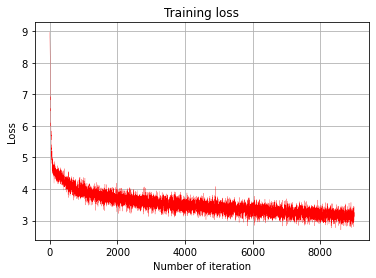

In [ ]:
## RNN without GRU
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), RNN_with_out_GRU[1], label='Training Loss', linewidth=0.20, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 3.7439
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 3.3586
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 3.2921
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 3.2604
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 3.4446
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 3.2724
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 3.1069
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 3.1552
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 3.3492
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 3.4490
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 3.4484
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 3.3140
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 3.2213
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 3.5055
Iteration: 4018

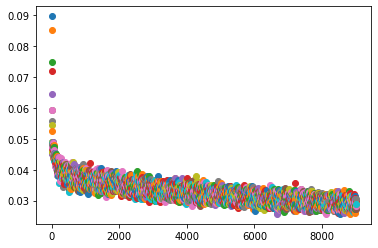

In [ ]:
RNN_with_out_GRU = trainIters(model_name, voc, pairs, RNN_without_GRU_encoder, RNN_without_GRU_decoder,  encoder_optimizer_RNN_without_GRU_encoder, decoder_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

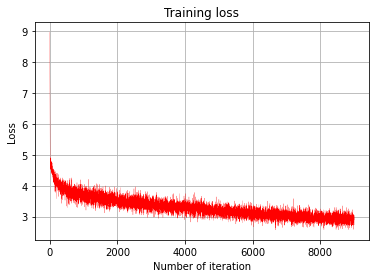

In [ ]:
## RNN without GRU
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), RNN_with_out_GRU[1], label='Training Loss', linewidth=0.20, color = "red")

In [ ]:
%matplotlib inline

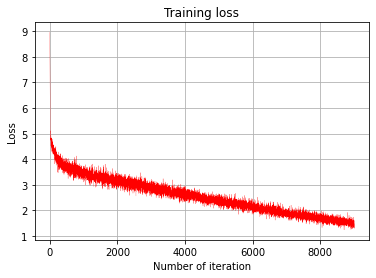

In [ ]:
## RNN loss plot
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), RNN[1], label='Training Loss', linewidth=0.20, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4003; Percent complete: 44.5%; Average RNN loss: 4.0308
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 4.0504
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 4.2112
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 4.2147
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 3.8348
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 3.9359
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 4.3174
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 4.0478
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 3.9610
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 4.2087
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 4.1460
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 4.1884
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 4.1906
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 4.2138
Iteration: 4017

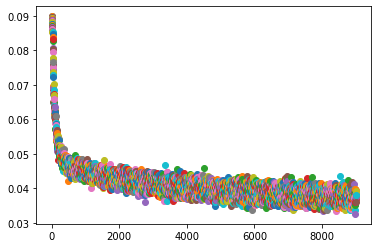

<Figure size 432x288 with 0 Axes>

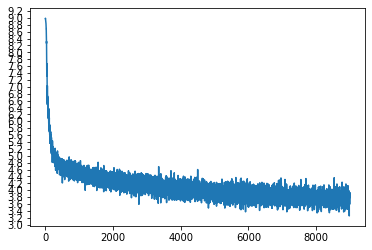

In [ ]:
RNN_SGD = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder,  encoder_SGD_optimizer_RNN, decoder_SGD_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

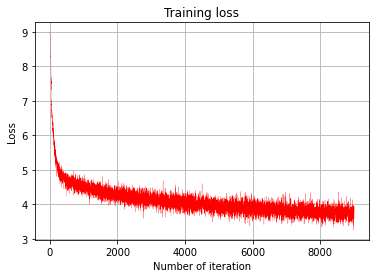

In [ ]:
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), RNN_SGD[1], label='Training Loss', linewidth=0.20, color = "red")

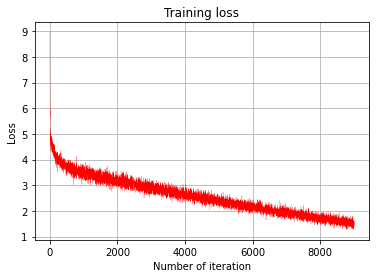

In [ ]:
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), GRU[1], label='Training Loss', linewidth=0.20, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 8.9646
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 8.9624
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 8.9689
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 8.9637
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 8.9667
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 8.9672
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 8.9649
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 8.9634
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 8.9658
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 8.9638
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 8.9657
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 8.9711
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 8.9741
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 8.9681
Iteration: 4018

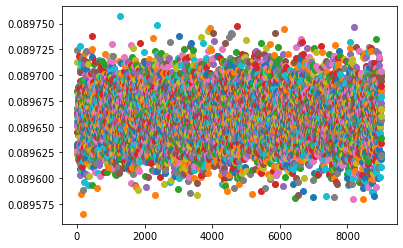

In [ ]:
# encoder_SGD_optimizer_RNN_without_GRU_encoder = optim.SGD(RNN_without_GRU_encoder.parameters(), lr=learning_rate, momentum= 0.1)
# decoder_SGD_optimizer_RNN_without_GRU_decoder = optim.SGD(RNN_without_GRU_decoder.parameters(), lr=learning_rate, momentum= 0.1)

GRU_SGD = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_SGD_optimizer_RNN_without_GRU_encoder, decoder_SGD_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

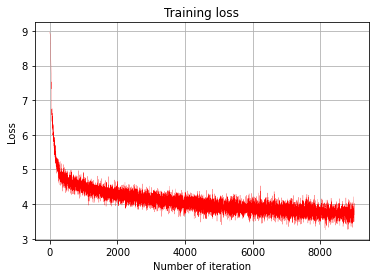

In [ ]:
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), GRU_SGD[1], label='Training Loss', linewidth=0.20, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4003; Percent complete: 44.5%; Average LSTM loss: 3.6516
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 3.7281
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 3.6972
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 3.5590
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 3.7397
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 3.5509
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 3.6958
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 3.3720
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 3.6938
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 3.6528
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 3.5346
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 3.5740
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 3.4965
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 3.5678
I

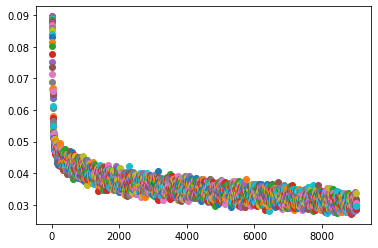

In [ ]:
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_optimizer_LSTM, decoder_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

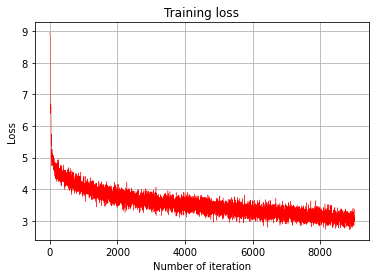

In [ ]:
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), LSTM[1], label='Training Loss', linewidth=0.40, color = "red")


### GRU fine tuning

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 2.5579
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 2.6571
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 2.5588
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 2.5273
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 2.5252
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 2.5943
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 2.5629
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 2.8479
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 2.4422
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 2.6229
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 2.5618
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 2.6864
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 2.5872
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 2.5543
Iteration: 4018

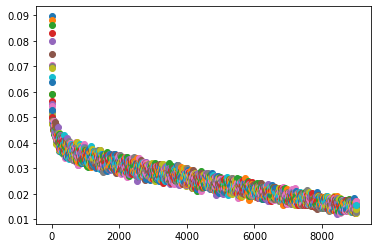

In [ ]:
## atten = general
GRU = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_optimizer_RNN, decoder_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

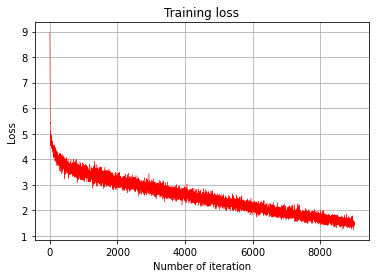

In [ ]:
## atten = dot
## Avg loss = 1.4674
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), GRU[1], label='Training Loss', linewidth=0.40, color = "red")

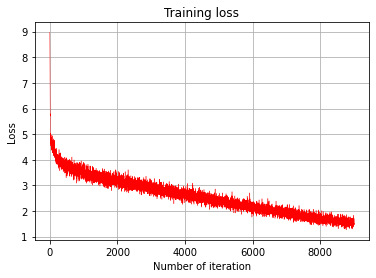

In [ ]:
## atten = general
## Avg loss = 1.5197
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), GRU[1], label='Training Loss', linewidth=0.40, color = "red")

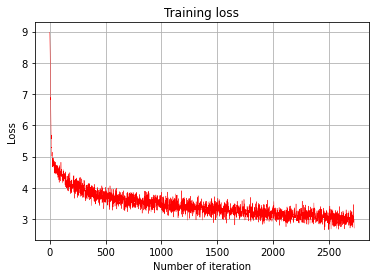

In [ ]:
## atten = concat
## Avg loss = ???
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), GRU[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 4.7263
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 4.7498
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 4.6835
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 4.9114
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 4.5325
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 4.7917
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 4.7591
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 4.5103
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 4.7729
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 4.7609
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 4.7763
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 4.6194
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 4.6305
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 4.7383
Iteration: 4018

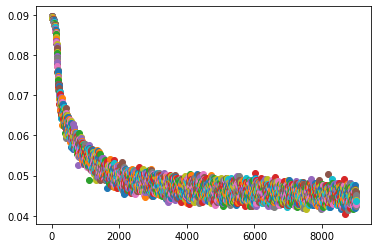

In [ ]:
## SGD  encoder_SGD_optimizer_RNN   /   decoder_SGD_optimizer_RNN
GRU = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_SGD_optimizer_RNN, decoder_SGD_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

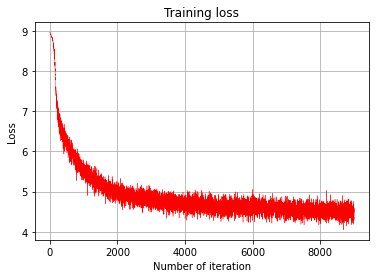

In [ ]:
## dot and SGD
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), GRU[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 4.7324
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 4.5743
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 4.8772
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 4.2889
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 4.3607
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 4.8649
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 4.9416
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 5.0203
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 4.8021
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 4.6921
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 5.1846
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 4.7326
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 4.4836
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 4.7007
Iteration: 4018

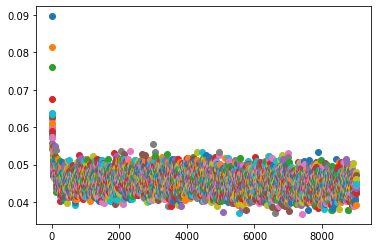

In [ ]:
GRU = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_optimizer_RNN, decoder_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

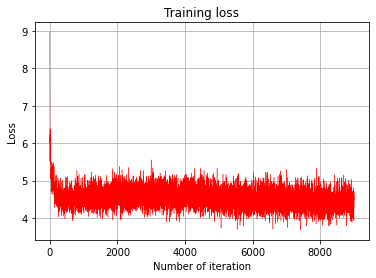

In [ ]:
## learning rate lr = 0.001
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), GRU[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 3.5319
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 3.6069
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 3.3261
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 3.7457
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 3.5886
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 3.7043
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 3.8711
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 3.5190
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 3.8691
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 3.9316
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 3.5251
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 3.5362
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 3.5815
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 3.7685
Iteration: 4018

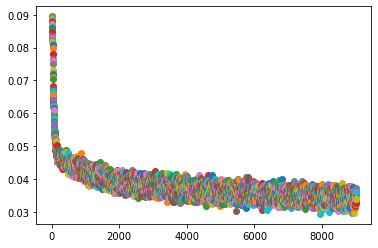

In [ ]:
GRU = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_optimizer_RNN, decoder_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

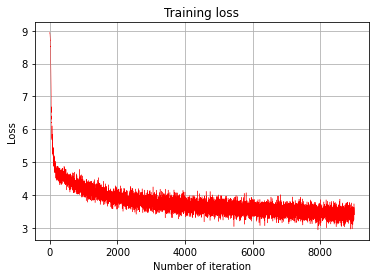

In [ ]:
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), GRU[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 2.6299
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 2.9418
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 2.5142
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 2.5476
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 2.5183
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 2.4275
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 2.3896
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 2.6572
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 2.5402
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 2.7391
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 2.8172
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 2.3811
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 2.5388
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 2.5121
Iteration: 4018

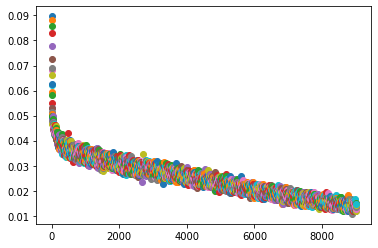

In [ ]:
GRU = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_optimizer_RNN, decoder_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 2.9357
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 3.0035
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 2.7670
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 2.4482
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 2.7211
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 2.5781
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 2.7905
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 2.8945
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 2.6425
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 2.7204
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 2.5911
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 2.8175
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 2.8413
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 2.5992
Iteration: 4018

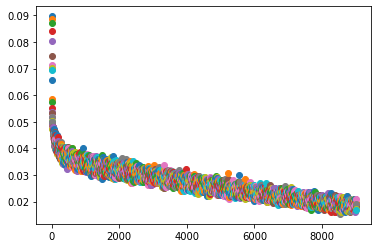

In [ ]:
GRU = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_optimizer_RNN, decoder_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 2.6253
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 2.5264
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 2.5973
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 2.5442
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 2.5885
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 2.4188
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 2.6886
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 2.6234
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 2.5960
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 2.5135
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 2.3140
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 2.6315
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 2.6309
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 2.4974
Iteration: 4018

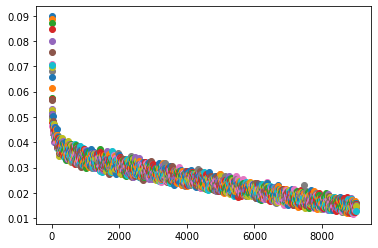

In [ ]:
## here
GRU = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_optimizer_RNN, decoder_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 2.5983
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 2.4826
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 2.3768
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 2.7645
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 2.7907
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 2.6917
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 2.5046
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 2.7766
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 2.7905
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 2.4405
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 2.8656
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 2.4189
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 2.6453
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 2.5691
Iteration: 4018

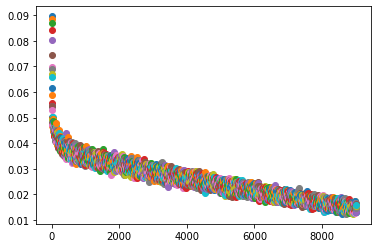

In [ ]:
GRU = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_optimizer_RNN, decoder_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 4.0089
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 4.2182
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 4.0855
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 3.7832
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 4.0188
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 4.1633
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 4.1382
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 3.8971
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 3.8835
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 4.0517
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 3.5811
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 4.1781
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 4.1425
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 4.1141
Iteration: 4018

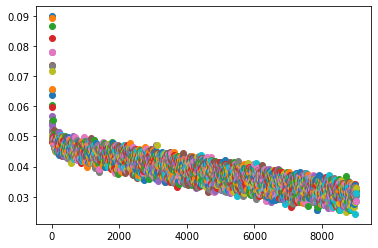

In [ ]:
GRU = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_optimizer_RNN, decoder_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

In [ ]:
GRU = trainIters(model_name, voc, pairs, RNN_encoder, RNN_decoder, encoder_optimizer_RNN, decoder_optimizer_RNN,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 2.5338
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 2.6860
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 2.6536
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 2.7472
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 2.6560
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 2.5916
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 2.7343
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 2.4633
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 2.9347
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 2.5202
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 2.6660
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 2.4460
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 2.6715
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 2.8841
Iteration: 4018


## **LSTM Fine tuning**

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 3.3071
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 3.5462
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 3.7789
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 3.4352
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 3.4507
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 3.5913
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 3.3574
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 3.3695
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 3.3634
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 3.7077
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 3.2045
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 3.3829
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 3.4767
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 3.4037
I

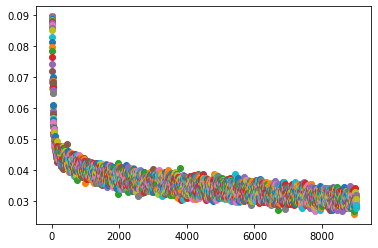

In [ ]:
## atten = general burda kaldik 29/12
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_optimizer_LSTM, decoder_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

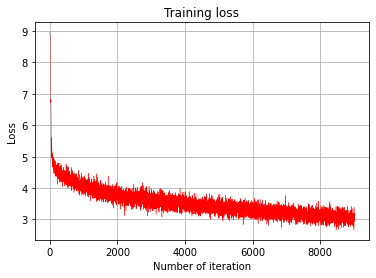

In [ ]:
##attn = dot

plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), LSTM[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 2.0749
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 2.1147
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 2.0248
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 2.1509
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 2.3536
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 2.2093
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 2.2941
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 2.2512
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 2.2464
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 2.1891
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 2.4181
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 2.0202
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 2.2643
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 2.2214
I

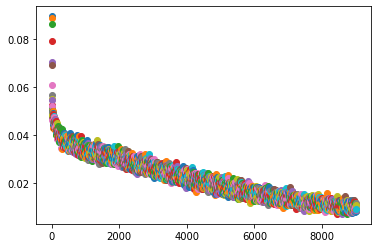

In [ ]:
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_optimizer_LSTM, decoder_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

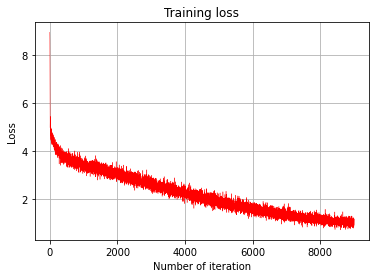

In [ ]:

plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), LSTM[1], label='Training Loss', linewidth=0.40, color = "red")

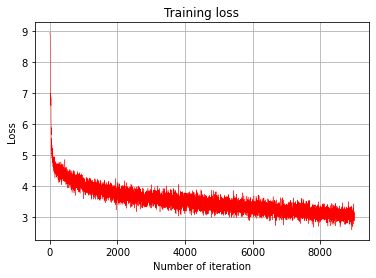

In [ ]:
##attn = general

plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), LSTM[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 6.8938
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 6.6313
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 6.8264
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 6.6164
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 6.5861
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 7.1200
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 6.8043
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 6.9860
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 6.6356
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 6.7877
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 6.6652
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 6.7328
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 6.7022
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 6.7512
I

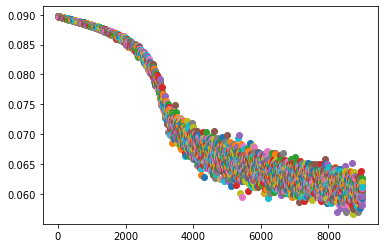

In [ ]:
# encoder_SGD_optimizer_LSTM = optim.SGD(LSTM_encoder.parameters(), lr=learning_rate, momentum= 0.1)
# decoder_SGD_optimizer_LSTM = optim.SGD(LSTM_decoder.parameters(), lr=learning_rate, momentum= 0.1)

LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_SGD_optimizer_LSTM, decoder_SGD_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

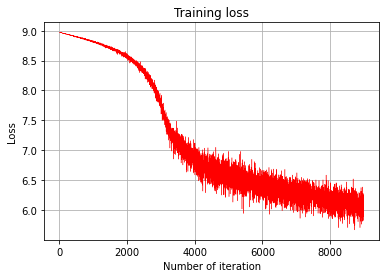

In [ ]:

plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), LSTM[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 6.7905
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 6.8805
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 6.9446
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 6.7466
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 6.7375
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 6.9424
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 6.8351
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 6.9843
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 6.8863
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 6.6762
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 6.9157
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 6.8446
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 6.8020
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 6.9777
I

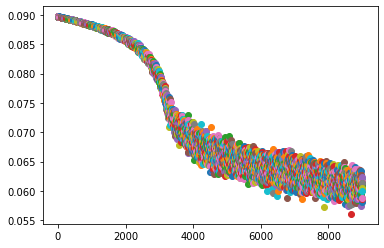

In [ ]:
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_SGD_optimizer_LSTM, decoder_SGD_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 4.3395
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 4.4919
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 4.3790
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 4.1865
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 4.3046
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 4.4070
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 4.3848
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 4.2582
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 4.4448
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 4.1814
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 4.1455
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 4.3952
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 4.3797
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 4.2773
I

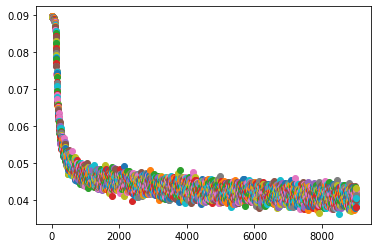

In [ ]:
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_optimizer_LSTM, decoder_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

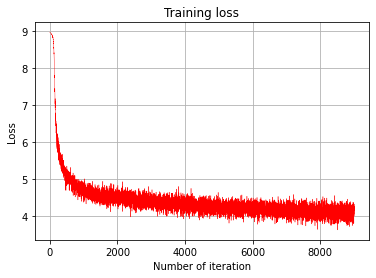

In [ ]:
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), LSTM[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 3.4942
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 3.4868
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 3.2507
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 3.4024
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 3.2118
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 3.5608
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 3.4739
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 3.4203
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 3.6781
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 3.3962
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 3.4939
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 3.3975
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 3.5169
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 3.4702
I

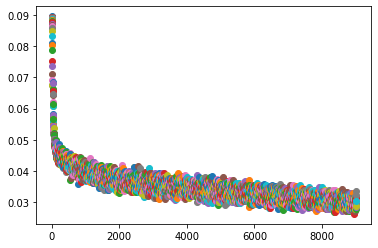

In [ ]:
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_optimizer_LSTM, decoder_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

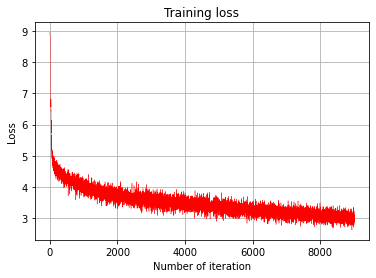

In [ ]:
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), LSTM[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 3.5304
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 3.8952
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 3.5820
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 3.4239
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 3.5199
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 3.5263
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 3.2241
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 3.2836
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 3.4638
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 3.4185
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 3.3794
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 3.6096
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 3.5516
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 3.5373
I

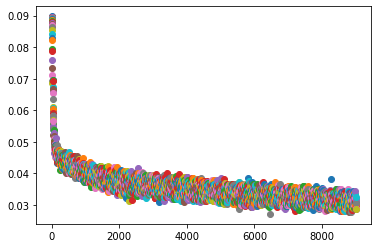

In [ ]:
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_optimizer_LSTM, decoder_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 3.4354
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 3.3667
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 3.7279
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 3.3617
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 3.2829
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 3.2988
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 3.6067
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 3.6377
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 3.6874
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 3.2173
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 3.5079
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 3.4069
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 3.3739
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 3.5491
I

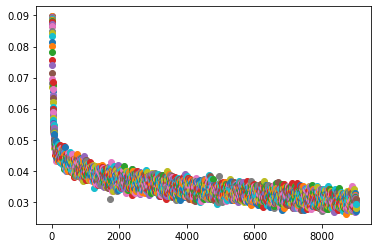

In [ ]:
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_optimizer_LSTM, decoder_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 3.2889
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 3.5865
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 3.4647
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 3.4112
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 3.7896
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 3.4404
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 3.2902
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 3.3973
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 3.3625
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 3.2409
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 3.4384
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 3.5396
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 3.2974
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 3.5550
I

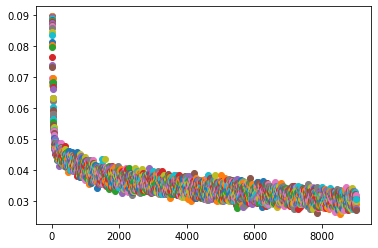

In [ ]:
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_optimizer_LSTM, decoder_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 4.4160
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 4.3199
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 4.5496
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 4.3430
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 4.6036
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 4.4795
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 4.4329
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 4.8516
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 4.5347
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 4.6211
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 4.4130
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 4.6595
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 4.5227
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 4.2841
I

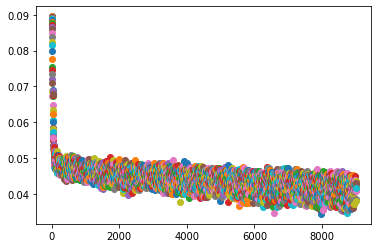

In [ ]:
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_optimizer_LSTM, decoder_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

In [ ]:
LSTM = trainIters(model_name, voc, pairs, LSTM_encoder, LSTM_decoder, encoder_optimizer_LSTM, decoder_optimizer_LSTM,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "LSTM")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average LSTM loss: 3.4745
Iteration: 4005; Percent complete: 44.5%; Average LSTM loss: 3.5808
Iteration: 4006; Percent complete: 44.5%; Average LSTM loss: 3.5494
Iteration: 4007; Percent complete: 44.5%; Average LSTM loss: 3.3533
Iteration: 4008; Percent complete: 44.5%; Average LSTM loss: 3.7199
Iteration: 4009; Percent complete: 44.5%; Average LSTM loss: 3.4012
Iteration: 4010; Percent complete: 44.6%; Average LSTM loss: 3.4085
Iteration: 4011; Percent complete: 44.6%; Average LSTM loss: 3.3211
Iteration: 4012; Percent complete: 44.6%; Average LSTM loss: 3.4026
Iteration: 4013; Percent complete: 44.6%; Average LSTM loss: 3.2612
Iteration: 4014; Percent complete: 44.6%; Average LSTM loss: 3.5789
Iteration: 4015; Percent complete: 44.6%; Average LSTM loss: 3.2119
Iteration: 4016; Percent complete: 44.6%; Average LSTM loss: 3.4545
Iteration: 4017; Percent complete: 44.6%; Average LSTM loss: 3.2405
I

## **RNN Fine tuning**

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 3.4892
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 3.3290
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 3.4111
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 3.3483
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 3.4533
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 3.5791
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 3.5641
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 3.4979
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 3.5704
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 3.5492
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 3.3978
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 3.5564
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 3.2822
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 3.4874
Iteration: 4018

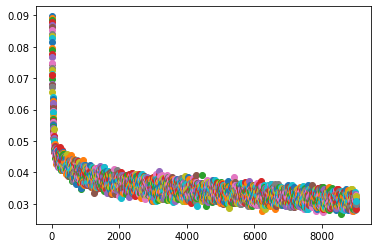

In [ ]:
## att = dot
RNN_with_out_GRU = trainIters(model_name, voc, pairs, RNN_without_GRU_encoder, RNN_without_GRU_decoder,  encoder_optimizer_RNN_without_GRU_encoder, decoder_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

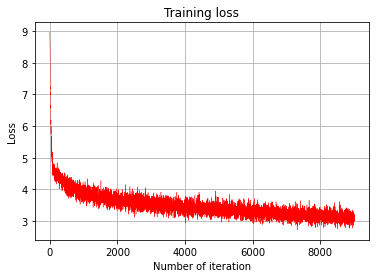

In [ ]:
## attn = general
# 9000 iteration
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), RNN_with_out_GRU[1], label='Training Loss', linewidth=0.40, color = "red")
plt.show()

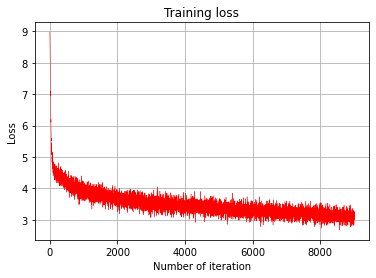

In [ ]:
## attn = dot
# 9000 iteration
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), RNN_with_out_GRU[1], label='Training Loss', linewidth=0.40, color = "red")
plt.show()

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 5.2065
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 5.4252
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 5.2408
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 5.0303
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 5.0028
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 5.3261
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 5.1488
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 5.0327
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 5.3479
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 5.1836
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 5.2912
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 5.1118
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 5.2672
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 5.2291
Iteration: 4018

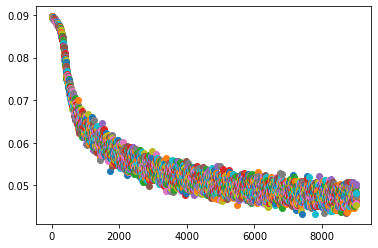

In [ ]:
# encoder_SGD_optimizer_RNN_without_GRU_encoder = optim.SGD(RNN_without_GRU_encoder.parameters(), lr=learning_rate, momentum= 0.1)
# decoder_SGD_optimizer_RNN_without_GRU_decoder = optim.SGD(RNN_without_GRU_decoder.parameters(), lr=learning_rate, momentum= 0.1)

RNN_with_out_GRU = trainIters(model_name, voc, pairs, RNN_without_GRU_encoder, RNN_without_GRU_decoder,  encoder_SGD_optimizer_RNN_without_GRU_encoder, decoder_SGD_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

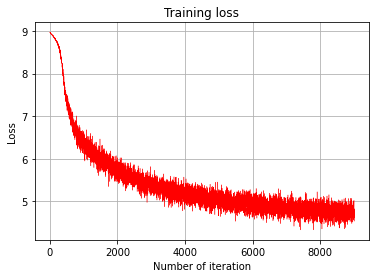

In [ ]:
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), RNN_with_out_GRU[1], label='Training Loss', linewidth=0.40, color = "red")
plt.show()

In [ ]:
import matplotlib

In [ ]:
# 9000 iteration
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), ibo[1], label='Training Loss', linewidth=0.40, color = "red")
plt.show()

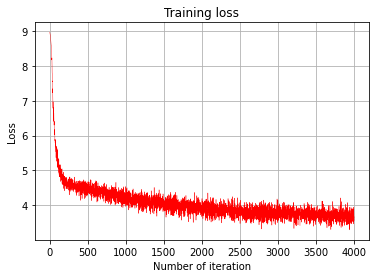

In [ ]:
# batch_size = 64
# learning_rate = 0.00001


plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,4000), ibo[1], label='Training Loss', linewidth=0.40, color = "red")

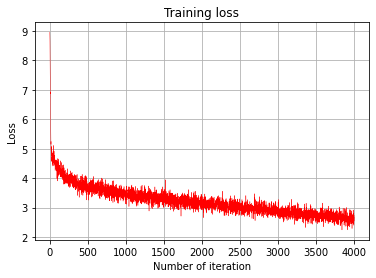

In [ ]:
# new attention
# attn_model = 'general'

plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,4000), ibo[1], label='Training Loss', linewidth=0.40, color = "red")

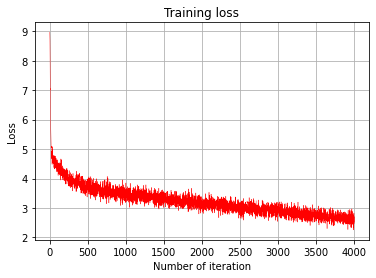

In [ ]:
# without attention
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,4000), ibo[1], label='Training Loss', linewidth=0.40, color = "red")

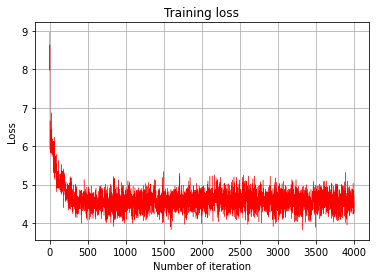

In [ ]:
# learning_rate = 0.001
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,4000), ibo[1], label='Training Loss', linewidth=0.40, color = "red")

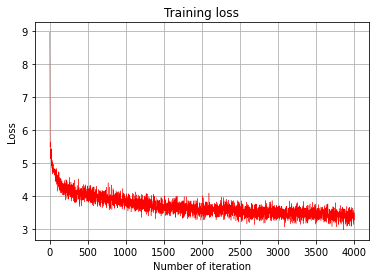

In [ ]:
# batch_size = 128
# learning_rate = 0.001
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,4000), ibo[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 4.1052
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 4.2345
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 4.2401
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 4.3229
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 4.0840
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 4.2632
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 4.2581
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 4.2320
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 3.9991
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 4.0167
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 4.1387
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 4.0908
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 4.2889
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 4.0703
Iteration: 4018

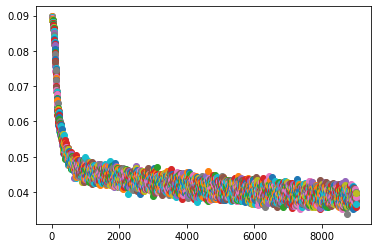

In [ ]:
RNN_with_out_GRU = trainIters(model_name, voc, pairs, RNN_without_GRU_encoder, RNN_without_GRU_decoder,  encoder_optimizer_RNN_without_GRU_encoder, decoder_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

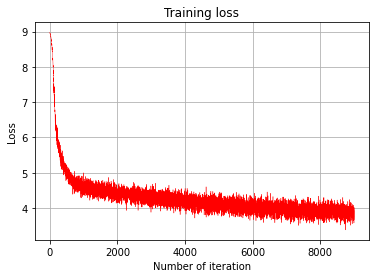

In [ ]:
# batch_size = 128
# learning_rate = 0.001
plt.title("Training loss")
plt.xlabel("Number of iteration")
plt.ylabel("Loss")
plt.grid()
plt.plot(range(0,9000), RNN_with_out_GRU[1], label='Training Loss', linewidth=0.40, color = "red")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 3.4688
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 3.7070
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 3.6722
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 3.3857
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 3.4145
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 3.3121
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 3.4154
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 3.4316
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 3.3820
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 3.3784
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 3.1388
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 3.0797
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 3.5067
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 3.5379
Iteration: 4018

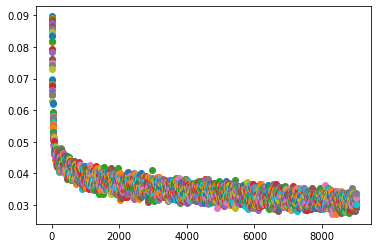

In [ ]:
RNN_with_out_GRU = trainIters(model_name, voc, pairs, RNN_without_GRU_encoder, RNN_without_GRU_decoder,  encoder_optimizer_RNN_without_GRU_encoder, decoder_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 3.7277
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 3.3412
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 3.6522
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 3.5724
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 3.7509
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 3.5867
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 3.6541
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 3.7211
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 3.7166
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 3.4764
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 3.6723
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 3.2437
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 3.4922
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 3.4032
Iteration: 4018

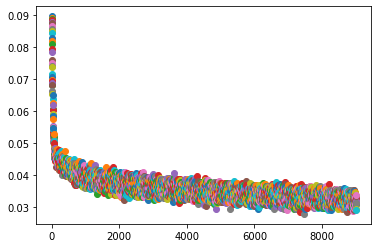

In [ ]:
RNN_with_out_GRU = trainIters(model_name, voc, pairs, RNN_without_GRU_encoder, RNN_without_GRU_decoder,  encoder_optimizer_RNN_without_GRU_encoder, decoder_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 3.3694
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 3.3992
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 3.3839
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 3.3885
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 3.3606
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 3.4706
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 3.7604
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 3.3552
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 3.4813
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 3.4415
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 3.5738
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 3.4842
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 3.4731
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 3.3001
Iteration: 4018

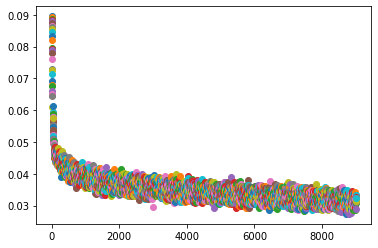

In [ ]:
RNN_with_out_GRU = trainIters(model_name, voc, pairs, RNN_without_GRU_encoder, RNN_without_GRU_decoder,  encoder_optimizer_RNN_without_GRU_encoder, decoder_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 3.6690
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 3.5822
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 3.4054
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 3.4314
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 3.4591
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 3.3891
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 3.5175
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 3.3598
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 3.3682
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 3.3933
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 3.6195
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 3.5766
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 3.2195
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 3.4064
Iteration: 4018

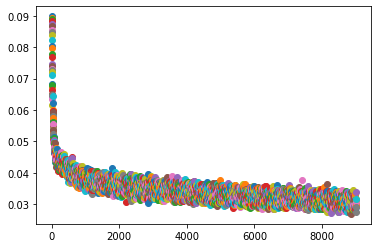

In [ ]:
RNN_with_out_GRU = trainIters(model_name, voc, pairs, RNN_without_GRU_encoder, RNN_without_GRU_decoder,  encoder_optimizer_RNN_without_GRU_encoder, decoder_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Iteration: 4004; Percent complete: 44.5%; Average RNN loss: 4.4140
Iteration: 4005; Percent complete: 44.5%; Average RNN loss: 4.6339
Iteration: 4006; Percent complete: 44.5%; Average RNN loss: 4.6413
Iteration: 4007; Percent complete: 44.5%; Average RNN loss: 4.3988
Iteration: 4008; Percent complete: 44.5%; Average RNN loss: 4.4316
Iteration: 4009; Percent complete: 44.5%; Average RNN loss: 4.4495
Iteration: 4010; Percent complete: 44.6%; Average RNN loss: 4.2731
Iteration: 4011; Percent complete: 44.6%; Average RNN loss: 4.3893
Iteration: 4012; Percent complete: 44.6%; Average RNN loss: 4.2020
Iteration: 4013; Percent complete: 44.6%; Average RNN loss: 4.5965
Iteration: 4014; Percent complete: 44.6%; Average RNN loss: 4.5701
Iteration: 4015; Percent complete: 44.6%; Average RNN loss: 4.5055
Iteration: 4016; Percent complete: 44.6%; Average RNN loss: 4.6913
Iteration: 4017; Percent complete: 44.6%; Average RNN loss: 4.4393
Iteration: 4018

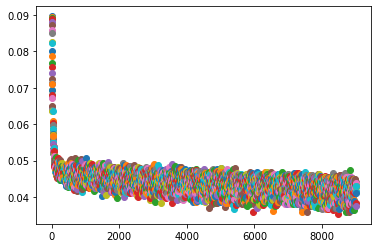

In [ ]:
RNN_with_out_GRU = trainIters(model_name, voc, pairs, RNN_without_GRU_encoder, RNN_without_GRU_decoder,  encoder_optimizer_RNN_without_GRU_encoder, decoder_optimizer_RNN_without_GRU_decoder,
           embedding, encoder_n_layers, decoder_n_layers, save_dir, n_iteration, batch_size,
           print_every, save_every, clip, corpus_name, loadFilename, "RNN_without_GRU")

In [ ]:
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
epo = range(1, 21)
print(epo)

range(1, 21)


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

### Run Evaluation

To chat with your model, run the following block.




In [ ]:
# Set dropout layers to eval mode
RNN_encoder.eval()
RNN_decoder.eval()

# Initialize search module
searcher = GreedySearchDecoder(RNN_encoder, RNN_decoder)


In [ ]:
## GRU Model
# Begin chatting (uncomment and run the following line to begin)
evaluateInput(RNN_encoder, RNN_decoder, searcher, voc)

> hello
Bot: hello . harris . luthor .
 blue score is 1.0
Cosine Similarity Score:  0.5773502691896258
Bot: hello . harris . luthor .
> how are you
Bot: i m coming . and watch .
 blue score is 0.030544559360566513
Cosine Similarity Score:  0.0
Bot: i m coming . and watch .
> who are you?
Bot: i m the bowler . squad . .
 blue score is 0.030456625871166064
Cosine Similarity Score:  0.0
Bot: i m the bowler . squad . .
> what is your name?
Bot: daniel . . . . .
 blue score is 0.01924622981717139
Cosine Similarity Score:  0.0
Bot: daniel . . . . .
> q


In [ ]:
RNN_encoder.eval()
RNN_decoder.eval()

# Initialize search module
searcher = GreedySearchDecoder(RNN_encoder, RNN_decoder)

In [ ]:
## RNN Model
RNN_without_GRU_encoder.eval()
RNN_without_GRU_decoder.eval()

searcher = GreedySearchDecoder(RNN_without_GRU_encoder, RNN_without_GRU_decoder)


In [ ]:
## RNN Model
# Begin chatting (uncomment and run the following line to begin)
evaluateInput(RNN_encoder, RNN_decoder, searcher, voc)

> hello
Bot: hi . you re a good man .
 blue score is 0.06007837481758424
Cosine Similarity Score:  0.0
Bot: hi . you re a good man .
> how are you?
Bot: i m fine . . .
 blue score is 0.018724372764461875
Cosine Similarity Score:  0.0
Bot: i m fine . . .
> who are you?
Bot: i m not going to see you .
 blue score is 0.10457138848650196
Cosine Similarity Score:  0.2182178902359924
Bot: i m not going to see you .
> q


In [ ]:
## LSTM Model
LSTM_encoder.eval()
LSTM_decoder.eval()
searcher = GreedySearchDecoder(LSTM_encoder, LSTM_decoder)

In [ ]:
evaluateInput(RNN_encoder, RNN_decoder, searcher, voc)

> hello
Bot: hello . . ? ?
 blue score is 1.0
Cosine Similarity Score:  1.0
Bot: hello . . ? ?
> how are you?
Bot: i m fine . five . ?
 blue score is 0.022267157315461233
Cosine Similarity Score:  0.0
Bot: i m fine . five . ?
> who are you?
Bot: i m not here . you ?
 blue score is 0.1331052549170149
Cosine Similarity Score:  0.2581988897471611
Bot: i m not here . you ?
> q


## Conclusion

That’s all for this one, folks. Congratulations, you now know the
fundamentals to building a generative chatbot model! If you’re
interested, you can try tailoring the chatbot’s behavior by tweaking the
model and training parameters and customizing the data that you train
the model on.

Check out the other tutorials for more cool deep learning applications
in PyTorch!


